# Filters and Finding Edges

## Filters

Now, we’ve seen how to use color to help isolate a desired portion of an image and even help classify an image!

In addition to taking advantage of color information, we also have knowledge about patterns of grayscale intensity in an image. Intensity is a measure of light and dark similar to brightness, and we can use this knowledge to detect other areas or objects of interest.
For example, you can often identify the edges of an object by looking at an abrupt change in intensity which happens when an image changes from a very dark to light area.

To detect these changes, you’ll be using and creating specific image filters that look at groups of pixels and detect big changes in intensity in an image. These filters produce an output that shows these edges.

So, let’s take a closer look at these filters and see when they’re useful in processing images and identifying traits of interest.

# Frequency in Images

We have an intuition of what frequency means when it comes to sound. High-frequency is a high pitched noise, like a bird chirp or violin. And low frequency sounds are low pitch, like a deep voice or a bass drum. For sound, frequency actually refers to how fast a sound wave is oscillating; oscillations are usually measured in cycles/s (Hz), and high pitches and made by high-frequency waves. Examples of low and high-frequency sound waves are pictured below. On the y-axis is amplitude, which is a measure of sound pressure that corresponds to the perceived loudness of a sound and on the x-axis is time.

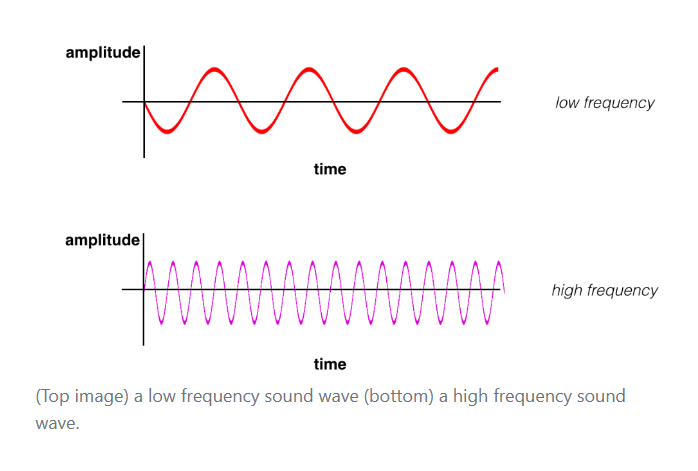

## High and low frequency

Similarly, frequency in images is a rate of change. But, what does it means for an image to change? Well, images change in space, and a high frequency image is one where the intensity changes a lot. And the level of brightness changes quickly from one pixel to the next. A low frequency image may be one that is relatively uniform in brightness or changes very slowly. This is easiest to see in an example.

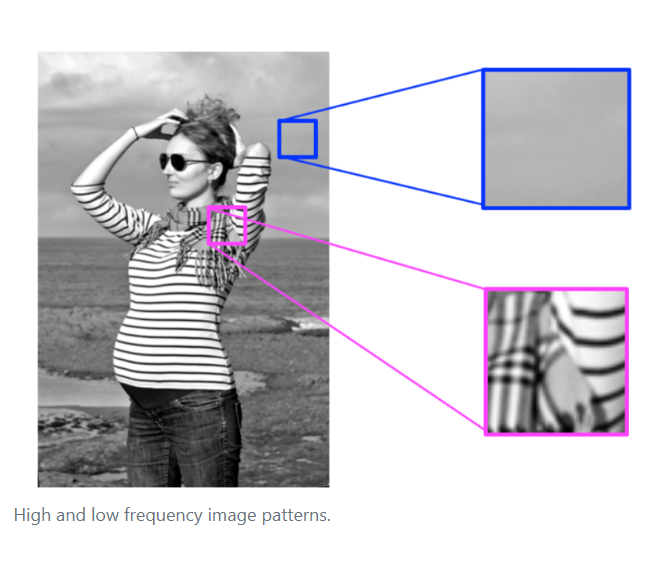

Most images have both high-frequency and low-frequency components. In the image above, on the scarf and striped shirt, we have a high-frequency image pattern; this part changes very rapidly from one brightness to another. Higher up in this same image, we see parts of the sky and background that change very gradually, which is considered a smooth, low-frequency pattern.

**High-frequency components also correspond to the edges of objects in images**, which can help us classify those objects.

## Fourier Transform

The Fourier Transform (FT) is an important image processing tool which is used to decompose an image into its frequency components. The output of an FT represents the image in the frequency domain, while the input image is the spatial domain (x, y) equivalent. In the frequency domain image, each point represents a particular frequency contained in the spatial domain image. So, for images with a lot of high-frequency components (edges, corners, and stripes), there will be a number of points in the frequency domain at high frequency values.

Take a look at how FT's are done with OpenCV, https://docs.opencv.org/3.0-beta/doc/py_tutorials/py_imgproc/py_transforms/py_fourier_transform/py_fourier_transform.html

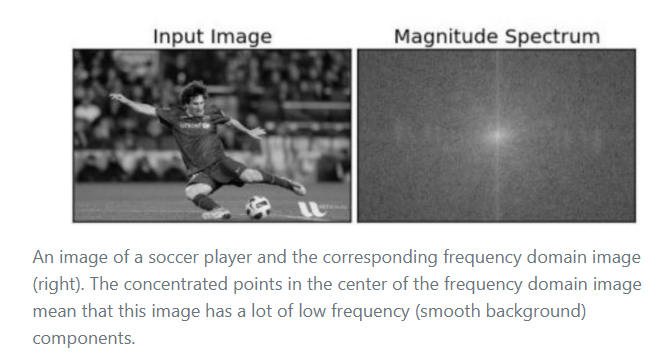

This decomposition is particularly interesting in the context of bandpass filters, which can isolate a certain range of frequencies and mask an image according to a low and high frequency threshold.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

%matplotlib inline

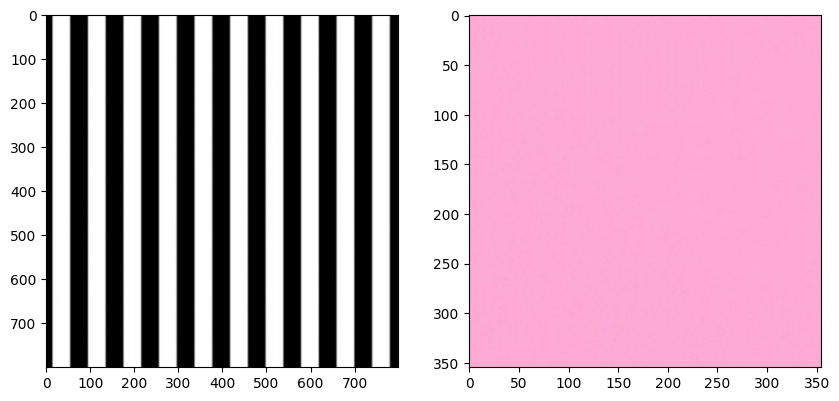

In [3]:
# Read in the images
image_stripes = cv2.imread('img/stripes.jpg')
# Change color to RGB (from BGR)
image_stripes = cv2.cvtColor(image_stripes, cv2.COLOR_BGR2RGB)

# Read in the images
image_solid = cv2.imread('img/pink_solid.jpg')
# Change color to RGB (from BGR)
image_solid = cv2.cvtColor(image_solid, cv2.COLOR_BGR2RGB)


# Display the images
f, (ax1,ax2) = plt.subplots(1, 2, figsize=(10,5))

ax1.imshow(image_stripes)
ax2.imshow(image_solid)

In [9]:
# convert to grayscale to focus on the intensity patterns in the image
gray_stripes = cv2.cvtColor(image_stripes, cv2.COLOR_RGB2GRAY)
gray_solid = cv2.cvtColor(image_solid, cv2.COLOR_RGB2GRAY)

# normalize the image color values from a range of [0,255] to [0,1] for further processing
norm_stripes = gray_stripes/255.0
norm_solid = gray_solid/255.0

# perform a fast fourier transform and create a scaled, frequency transform image
def ft_image(norm_image):
    '''This function takes in a normalized, grayscale image
       and returns a frequency spectrum transform of that image. '''
    f = np.fft.fft2(norm_image)
    fshift = np.fft.fftshift(f)
    frequency_tx = 20*np.log(np.abs(fshift))
    
    return frequency_tx

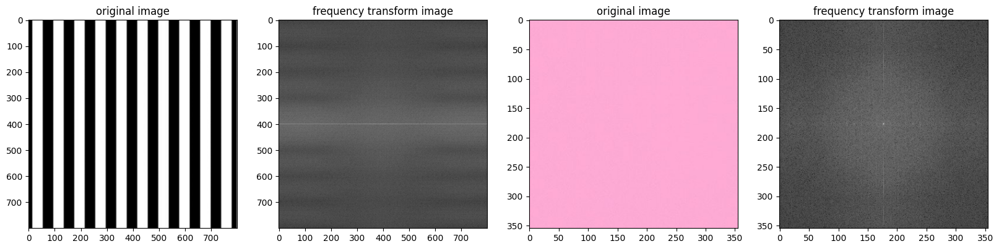

In [10]:
# Call the function on the normalized images
# and display the transforms
f_stripes = ft_image(norm_stripes)
f_solid = ft_image(norm_solid)

# display the images
# original images to the left of their frequency transform
f, (ax1,ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(20,10))

ax1.set_title('original image')
ax1.imshow(image_stripes)
ax2.set_title('frequency transform image')
ax2.imshow(f_stripes, cmap='gray')

ax3.set_title('original image')
ax3.imshow(image_solid)
ax4.set_title('frequency transform image')
ax4.imshow(f_solid, cmap='gray')

Low frequencies are at the center of the frequency transform image.

The transform images for these example show that the solid image has most low-frequency components (as seen by the center bright spot).

The stripes tranform image contains low-frequencies for the areas of white and black color and high frequencies for the edges in between those colors. The stripes transform image also tells us that there is one dominating direction for these frequencies; vertical stripes are represented by a horizontal line passing through the center of the frequency transform image.

Next, let's see what this looks like applied to a real-world image.

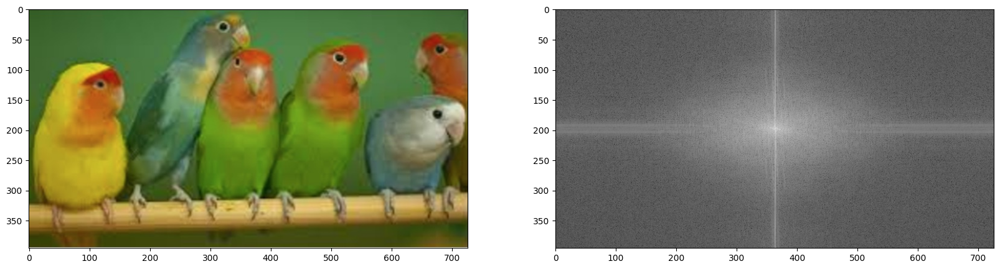

In [11]:
# Read in an image
image = cv2.imread('img/birds.jpg')
# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# normalize the image
norm_image = gray/255.0

f_image = ft_image(norm_image)

# Display the images
f, (ax1,ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.imshow(image)
ax2.imshow(f_image, cmap='gray')

Notice that this image has components of all frequencies. You can see a bright spot in the center of the transform image, which tells us that a large portion of the image is low-frequency; this makes sense since the body of the birds and background are solid colors. The transform image also tells us that there are **two** dominating directions for these frequencies; vertical edges (from the edges of birds) are represented by a horizontal line passing through the center of the frequency transform image, and horizontal edges (from the branch and tops of the birds' heads) are represented by a vertical line passing through the center.

#  High-pass Filters

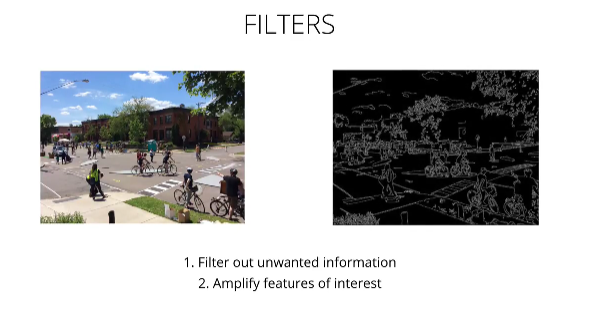

## Edge Handling

Kernel convolution relies on centering a pixel and looking at it's surrounding neighbors. So, what do you do if there are no surrounding pixels like on an image corner or edge? Well, there are a number of ways to process the edges, which are listed below. It’s most common to use padding, cropping, or extension. In extension, the border pixels of an image are copied and extended far enough to result in a filtered image of the same size as the original image.

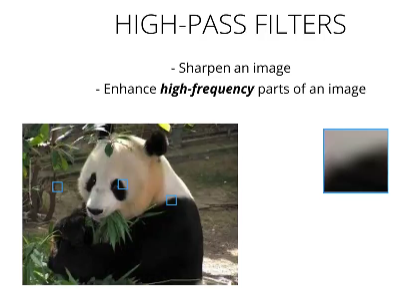

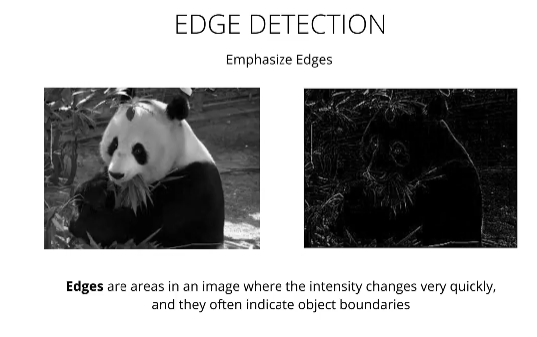

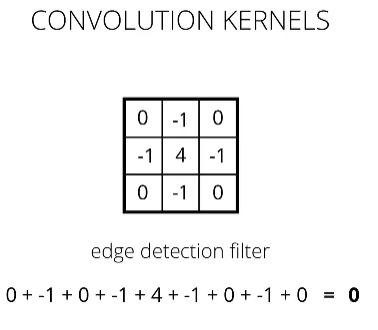

### Extend

The nearest border pixels are conceptually extended as far as necessary to provide values for the convolution. Corner pixels are extended in 90° wedges. Other edge pixels are extended in lines.

### Padding

The image is padded with a border of 0's, black pixels.

### Crop

Any pixel in the output image which would require values from beyond the edge is skipped. This method can result in the output image being slightly smaller, with the edges having been cropped.

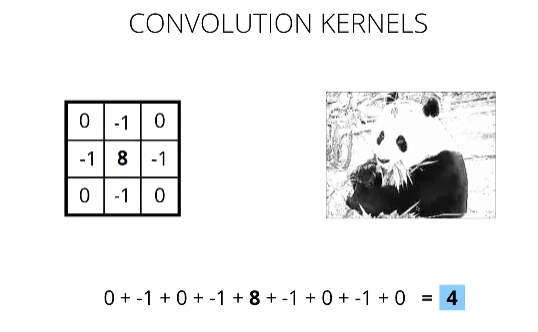

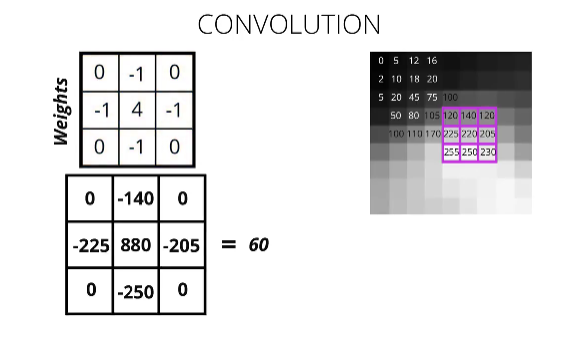

## Creating a Filter, Edge Detection

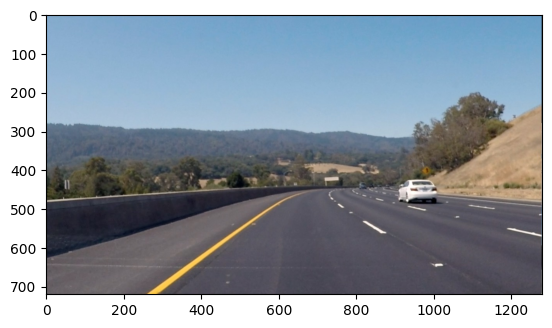

In [13]:
# Read in the image
image = mpimg.imread('img/curved_lane.jpg')

plt.imshow(image)

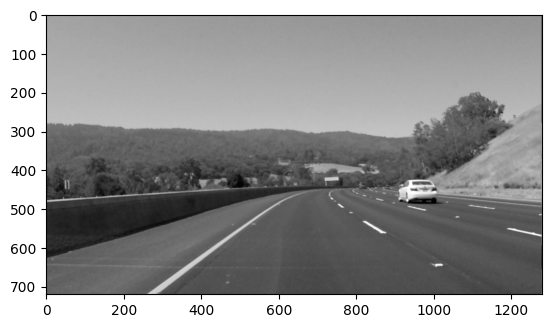

In [14]:
# Convert to grayscale for filtering
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

plt.imshow(gray, cmap='gray')

## Gradients

Gradients are a measure of intensity change in an image, and they generally mark object boundaries and changing area of light and dark. If we think back to treating images as functions, F(x, y), we can think of the gradient as a derivative operation F ’ (x, y). Where the derivative is a measurement of intensity change.

## Sobel filters

The Sobel filter is very commonly used in edge detection and in finding patterns in intensity in an image. Applying a Sobel filter to an image is a way of **taking (an approximation) of the derivative of the image** in the 
x or y direction. The operators for Sobel_x and Sobel_y, respectively, look like this:

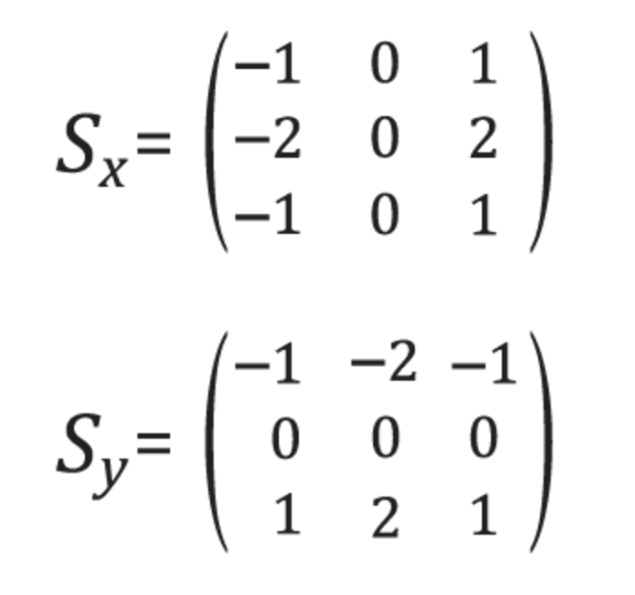

Next, let's see an example of these two filters applied to an image of the brain.

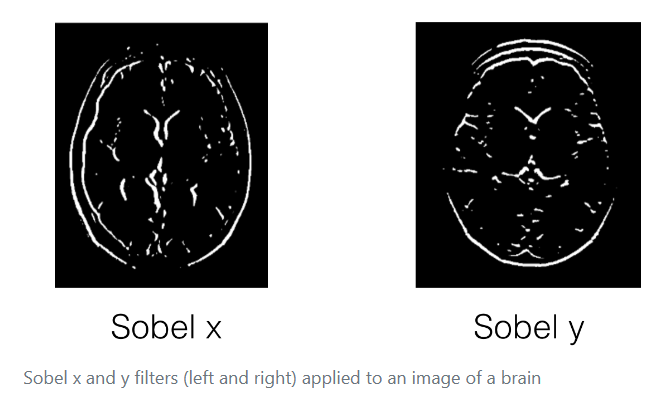

### x vs. y

In the above images, you can see that the gradients taken in both the x and the y directions detect the edges of the brain and pick up other edges. Taking the gradient in the x direction emphasizes edges closer to vertical. Alternatively, taking the gradient in the y direction emphasizes edges closer to horizontal.

## Magnitude

Sobel also detects which edges are strongest. This is encapsulated by the **magnitude** of the gradient; the greater the magnitude, the stronger the edge is. The magnitude, or absolute value, of the gradient is just the square root of the squares of the individual x and y gradients. For a gradient in both the x **and** y directions, the magnitude is the square root of the sum of the squares.

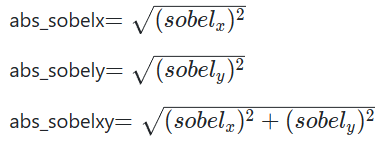

## Direction

In many cases, it will be useful to look for edges in a particular orientation. For example, we may want to find lines that only angle upwards or point left. By calculating the direction of the image gradient in the x and y directions separately, we can determine the direction of that gradient!

The direction of the gradient is simply the inverse tangent (arctangent) of the y gradient divided by the x gradient:

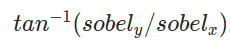

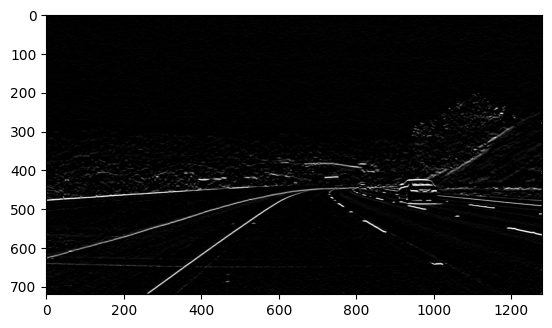

In [18]:
# Create a custom kernel

# 3x3 array for edge detection
sobel_y = np.array([[ -1, -2, -1], 
                   [ 0, 0, 0], 
                   [ 1, 2, 1]])

sobel_x = np.array([[-1, 0, -1],
                   [-1, 0, -3],
                   [-1, 0, -1]])


# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)  
filtered_image = cv2.filter2D(gray, -1, sobel_y)

plt.imshow(filtered_image, cmap='gray')

### Create binary Image

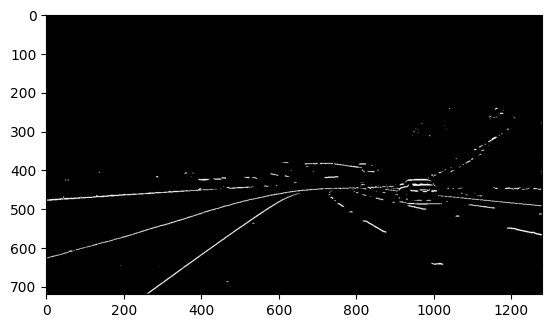

In [28]:
retval, binary_image = cv2.threshold(filtered_image, 120, 205, cv2.THRESH_BINARY)
plt.imshow(binary_image, cmap='gray')

In [29]:
retval

120.0

### In diffrent Image

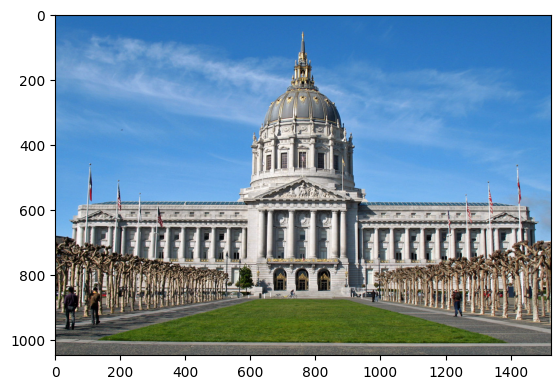

In [31]:
# Read in the image
image = cv2.imread('img/city_hall.jpg')

# Make a copy of the image
image_copy = np.copy(image)

# Change color to RGB (from BGR)
image_copy = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)

plt.imshow(image_copy)

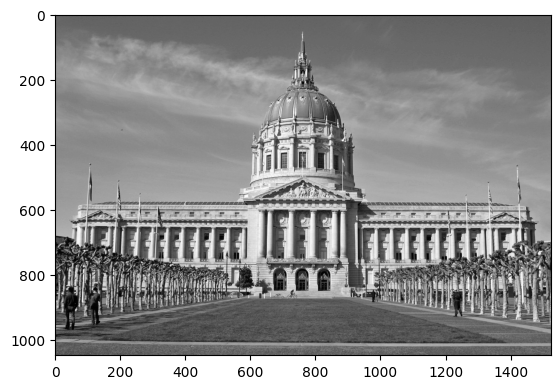

In [32]:
# Convert to grayscale for filtering
gray = cv2.cvtColor(image_copy, cv2.COLOR_RGB2GRAY)

plt.imshow(gray, cmap = 'gray')

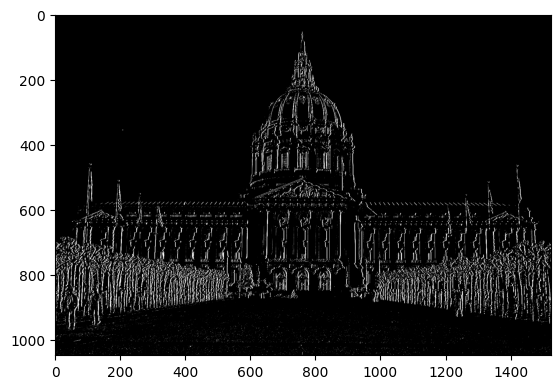

In [49]:
# Creating a Custom kernel
# Sobel Filter
sobel_x = np.array([[ -1, 0, -1],
                    [ -8, 1, 7],
                    [ -1, 0, 1]])

# Perform convolution using filter2D, which has imputs : (grayscale image, bit-depth, kernel)
filtered_image = cv2.filter2D(gray, -1, sobel_x)

plt.imshow(filtered_image, cmap='gray')

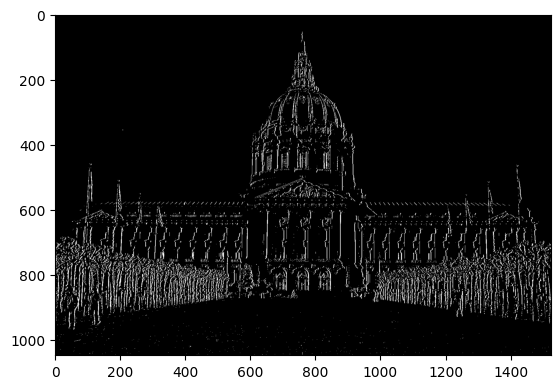

In [55]:
# Creating a binary image
# Create threshold that sets all the filtered pixels to white

retval, binary_image = cv2.threshold(filtered_image, 150, 255, cv2.THRESH_BINARY)
plt.imshow(binary_image, cmap='gray')

Text(0.5, 1.0, 'Canny Edge Detection')

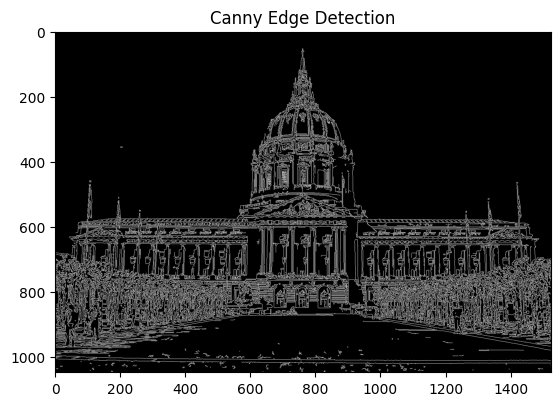

In [60]:
# Apply Canny edge detector
canny_edges = cv2.Canny(gray, 100, 250)

plt.imshow(canny_edges, cmap='gray')
plt.title("Canny Edge Detection")

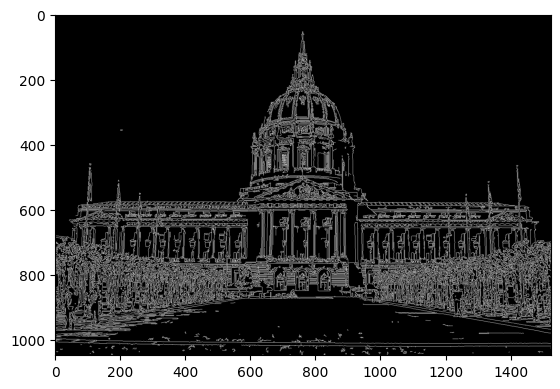

In [73]:
retval, binary_image = cv2.threshold(canny_edges, 150, 255, cv2.THRESH_BINARY)
plt.imshow(binary_image, cmap='gray')

Text(0.5, 1.0, 'Prewitt Edge Detection')

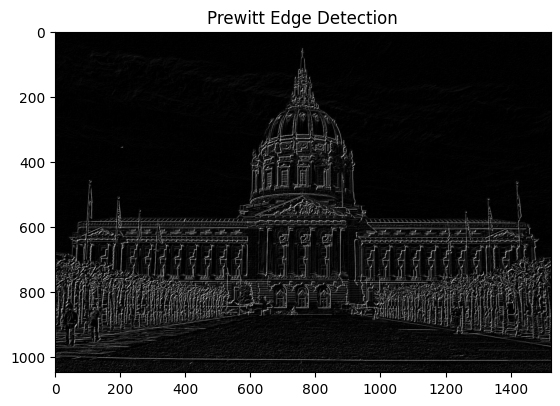

In [61]:
# Apply Prewitt filter
prewitt_x = cv2.filter2D(gray, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv2.filter2D(gray, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))

# Combine horizontal and vertical edges
prewitt_edges = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)

plt.imshow(prewitt_edges, cmap='gray')
plt.title("Prewitt Edge Detection")

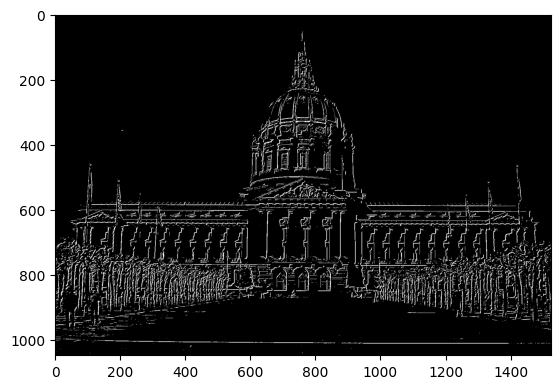

In [70]:
retval, binary_image = cv2.threshold(prewitt_edges, 100, 255, cv2.THRESH_BINARY)
plt.imshow(binary_image, cmap='gray')

### Some Other Edge Detection Filter

**Canny Edge Detector:**

The Canny edge detector is a multi-stage algorithm that includes Gaussian blurring, gradient computation, non-maximum suppression, and edge tracking by hysteresis. It is one of the most popular and effective edge detection methods.

Text(0.5, 1.0, 'Canny Edge Detection')

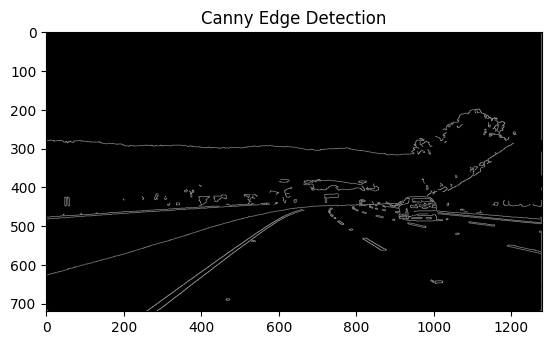

In [20]:
# Apply Canny edge detector
canny_edges = cv2.Canny(gray, 100, 200)

plt.imshow(canny_edges, cmap='gray')
plt.title("Canny Edge Detection")

**Prewitt Filter:**

The Prewitt filter is similar to the Sobel filter and is often used for edge detection. It consists of two 3x3 convolution kernels, one for detecting horizontal edges and the other for detecting vertical edges. You can use it in Python with OpenCV or other image processing libraries in a manner similar to the Sobel filter.

Text(0.5, 1.0, 'Prewitt Edge Detection')

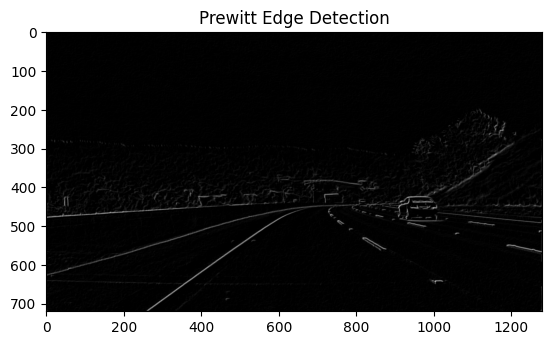

In [22]:
# Apply Prewitt filter
prewitt_x = cv2.filter2D(gray, -1, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
prewitt_y = cv2.filter2D(gray, -1, np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]]))

# Combine horizontal and vertical edges
prewitt_edges = cv2.addWeighted(prewitt_x, 0.5, prewitt_y, 0.5, 0)

plt.imshow(prewitt_edges, cmap='gray')
plt.title("Prewitt Edge Detection")

#  Low-pass Filters

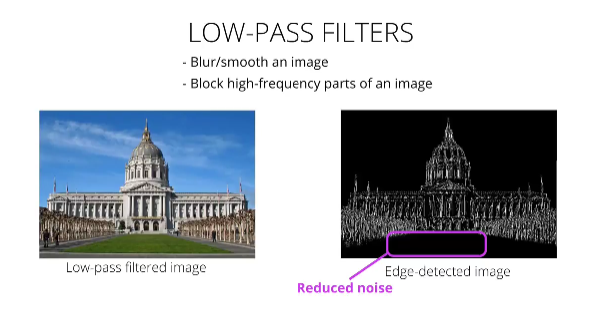

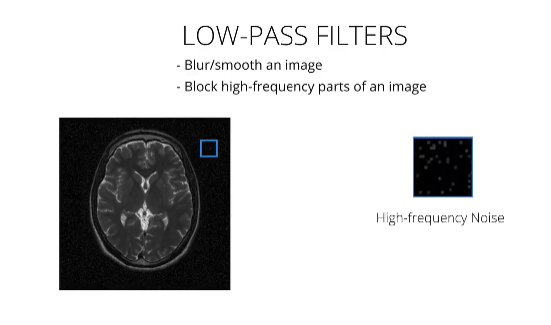

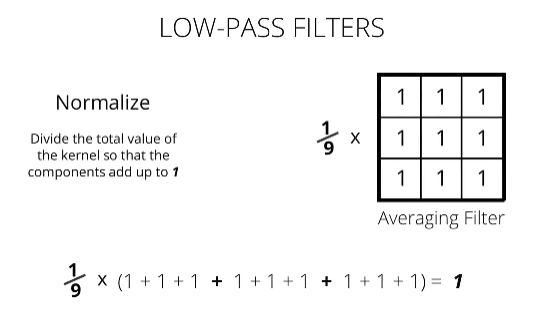

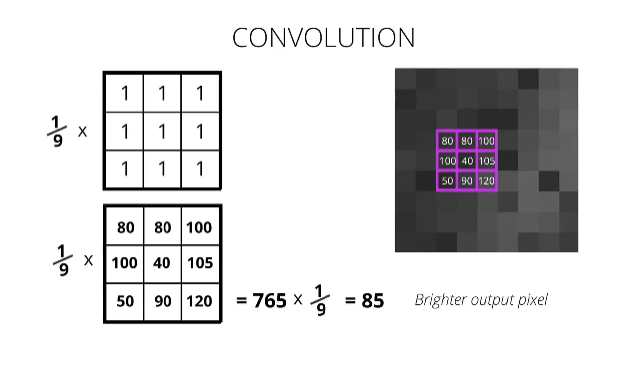

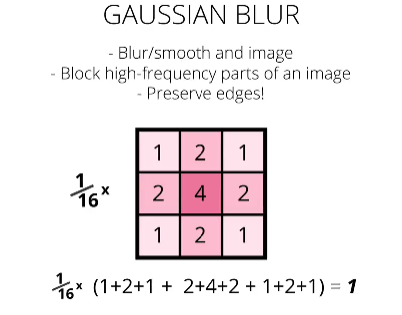

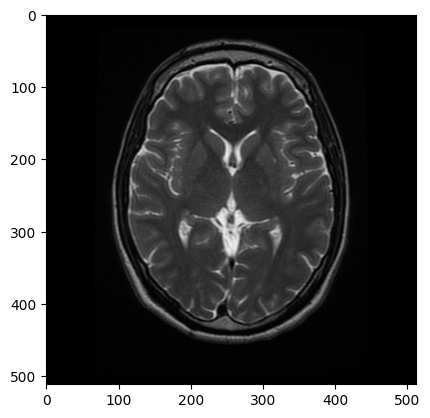

In [2]:
# Read in the image
image = cv2.imread('img/brain_MR.jpg')

# Make a copy of the image
image_copy = np.copy(image)

# Change color to RGB (from BGR)
image_copy = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)

plt.imshow(image_copy)

## Gaussian blur the image

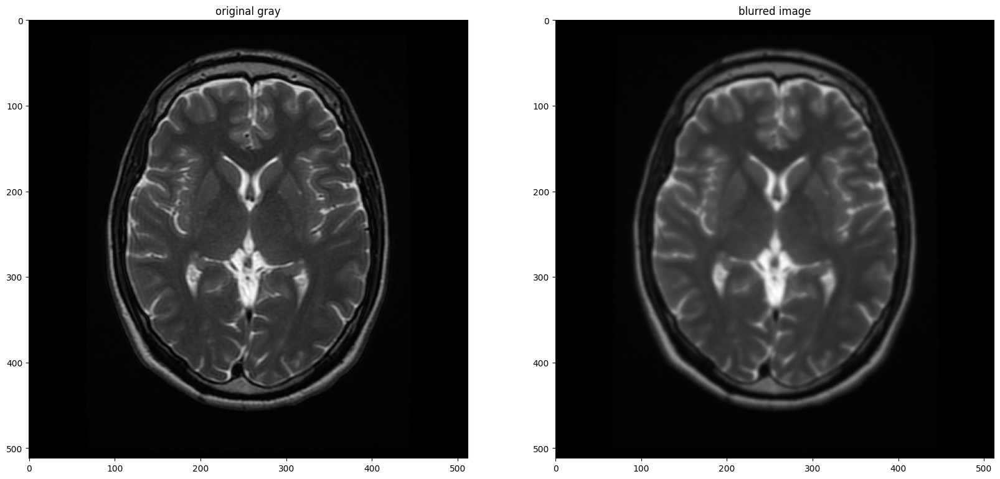

In [3]:
# Convert to grayscale for filtering
gray = cv2.cvtColor(image_copy, cv2.COLOR_RGB2GRAY)

# Create a Gaussian blurred image
gray_blur = cv2.GaussianBlur(gray, (9, 9), 0)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('original gray')
ax1.imshow(gray, cmap='gray')

ax2.set_title('blurred image')
ax2.imshow(gray_blur, cmap='gray')

## Test performance with a high-pass filter

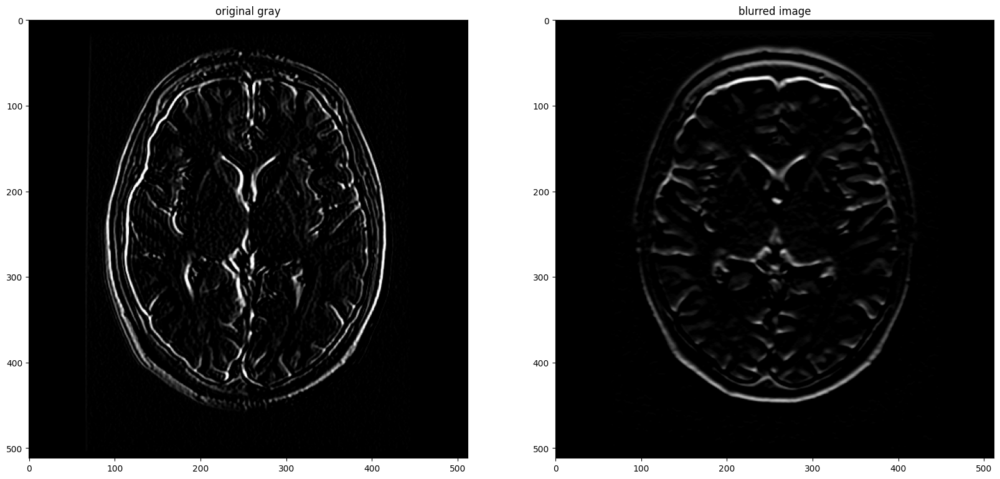

In [4]:
# High-pass filter 

# 3x3 sobel filters for edge detection
sobel_x = np.array([[ -1, 0, 1], 
                   [ -2, 0, 2], 
                   [ -1, 0, 1]])


sobel_y = np.array([[ -1, -2, -1], 
                   [ 0, 0, 0], 
                   [ 1, 2, 1]])


# Filter the orginal and blurred grayscale images using filter2D
filtered = cv2.filter2D(gray, -1, sobel_x)

filtered_blurred = cv2.filter2D(gray_blur, -1, sobel_y)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('original gray')
ax1.imshow(filtered, cmap='gray')

ax2.set_title('blurred image')
ax2.imshow(filtered_blurred, cmap='gray')

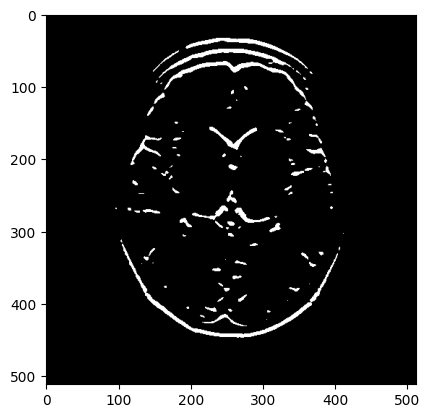

In [77]:
# Create threshold that sets all the filtered pixels to white
# Above a certain threshold

retval, binary_image = cv2.threshold(filtered_blurred, 50, 255, cv2.THRESH_BINARY)

plt.imshow(binary_image, cmap='gray')

Text(0.5, 1.0, 'Canny Edge Detection')

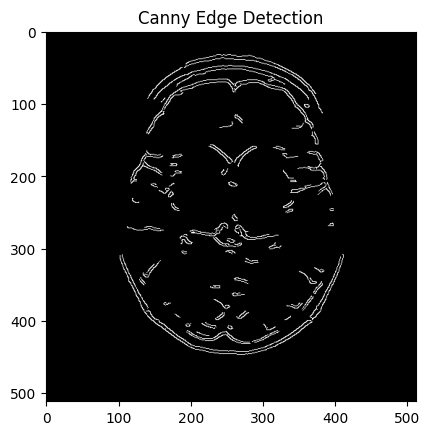

In [7]:
# Apply Canny edge detector
canny_edges = cv2.Canny(filtered_blurred, 120, 250)

plt.imshow(canny_edges, cmap='gray')
plt.title("Canny Edge Detection")

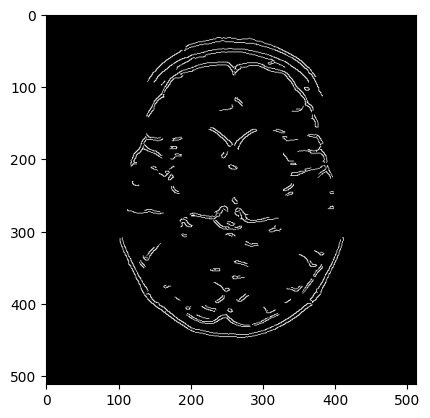

In [10]:
retval, binary_image = cv2.threshold(canny_edges, 15, 255, cv2.THRESH_BINARY)

plt.imshow(binary_image, cmap='gray')

# Fourier Transform of Filters

## High and Low Pass Filters

Now, you might be wondering, what makes filters high and low-pass; why is a Sobel filter high-pass and a Gaussian filter low-pass?

Well, you can actually visualize the frequencies that these filters block out by taking a look at their fourier transforms. The frequency components of any image can be displayed after doing a Fourier Transform (FT). An FT looks at the components of an image (edges that are high-frequency, and areas of smooth color as low-frequency), and plots the frequencies that occur as points in spectrum. So, let's treat our filters as small images, and display them in the frequency domain!

In [11]:
# Define gaussian, sobel, and laplacian (edge) filters

gaussian = (1/9)*np.array([[1, 1, 1],
                           [1, 1, 1],
                           [1, 1, 1]])

sobel_x= np.array([[-1, 0, 1],
                   [-2, 0, 2],
                   [-1, 0, 1]])

sobel_y= np.array([[-1,-2,-1],
                   [0, 0, 0],
                   [1, 2, 1]])

In [12]:
# laplacian, edge filter
laplacian=np.array([[0, 1, 0],
                    [1,-4, 1],
                    [0, 1, 0]])

filters = [gaussian, sobel_x, sobel_y, laplacian]
filter_name = ['gaussian','sobel_x', \
                'sobel_y', 'laplacian']

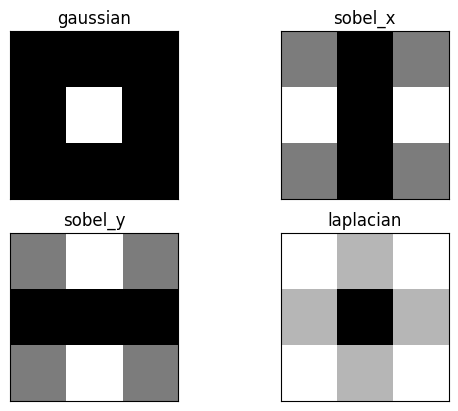

In [13]:
# perform a fast fourier transform on each filter
# and create a scaled, frequency transform image
f_filters = [np.fft.fft2(x) for x in filters]
fshift = [np.fft.fftshift(y) for y in f_filters]
frequency_tx = [np.log(np.abs(z)+1) for z in fshift]

# display 4 filters
for i in range(len(filters)):
    plt.subplot(2,2,i+1),plt.imshow(frequency_tx[i],cmap = 'gray')
    plt.title(filter_name[i]), plt.xticks([]), plt.yticks([])

plt.show()

Areas of white or light gray, allow that part of the frequency spectrum through! Areas of black mean that part of the spectrum is blocked out of the image.

Recall that the low frequencies in the frequency spectrum are at the center of the frequency transform image, and high frequencies are at the edges. You should see that the Gaussian filter allows only low-pass frequencies through, which is the center of the frequency transformed image. The sobel filters block out frequencies of a certain orientation and a laplace (detects edges regardless of orientation) filter, should block out low-frequencies!

In [16]:
# Load the image
image = cv2.imread('img/brain_MR.jpg', cv2.IMREAD_GRAYSCALE)

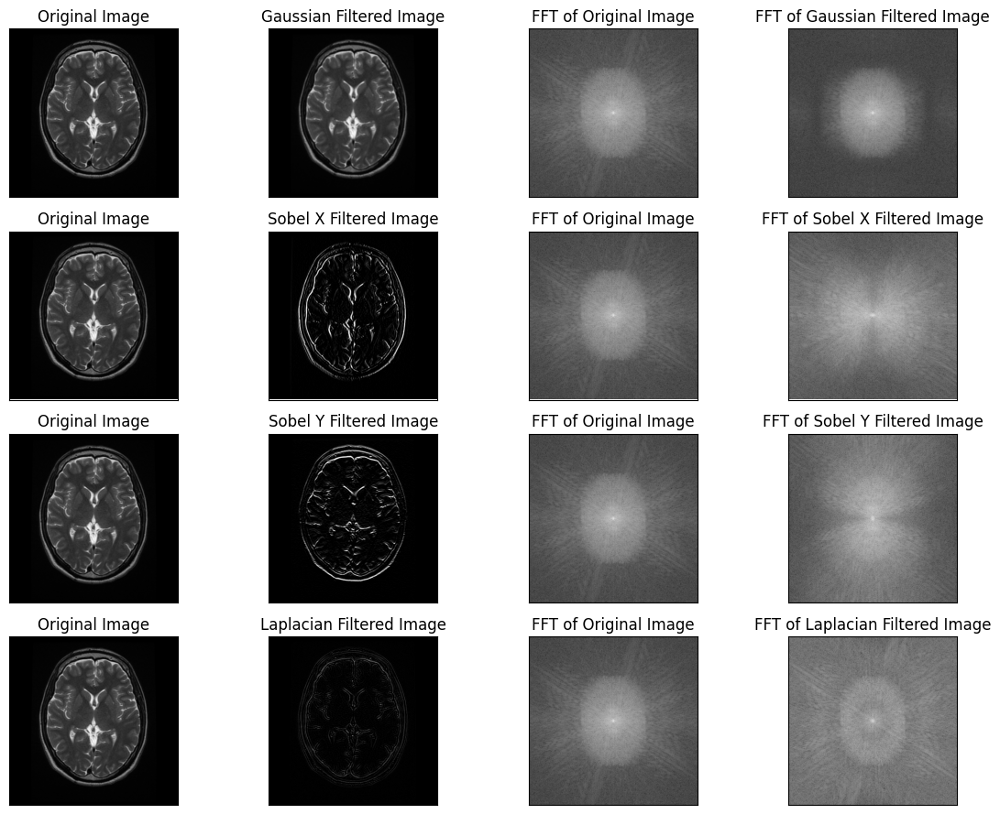

In [17]:
# Define a list of filters and their corresponding names
filters = [gaussian, sobel_x, sobel_y, laplacian]
filter_names = ['Gaussian', 'Sobel X', 'Sobel Y', 'Laplacian']

# Create a subplot for displaying the images and their FFTs
plt.figure(figsize=(12, 9))

for i, (filter, filter_name) in enumerate(zip(filters, filter_names)):
    # Apply the filter to the image
    filtered_image = cv2.filter2D(image, -1, filter)

    # Perform FFT on the original and filtered images
    fft_original = np.fft.fft2(image)
    fft_filtered = np.fft.fft2(filtered_image)

    # Shift the zero frequency component to the center of the spectrum
    fft_original_shifted = np.fft.fftshift(fft_original)
    fft_filtered_shifted = np.fft.fftshift(fft_filtered)

    # Calculate the magnitude spectrum and apply logarithmic scaling
    magnitude_spectrum_original = np.log(np.abs(fft_original_shifted) + 1)
    magnitude_spectrum_filtered = np.log(np.abs(fft_filtered_shifted) + 1)

    # Display the original and filtered images and their Fourier transforms
    plt.subplot(4, 4, i * 4 + 1), plt.imshow(image, cmap='gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(4, 4, i * 4 + 2), plt.imshow(filtered_image, cmap='gray')
    plt.title(f'{filter_name} Filtered Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(4, 4, i * 4 + 3), plt.imshow(magnitude_spectrum_original, cmap='gray')
    plt.title(f'FFT of Original Image'), plt.xticks([]), plt.yticks([])

    plt.subplot(4, 4, i * 4 + 4), plt.imshow(magnitude_spectrum_filtered, cmap='gray')
    plt.title(f'FFT of {filter_name} Filtered Image'), plt.xticks([]), plt.yticks([])

plt.tight_layout()
plt.show()

**Histograms:** Plot the histograms of the original and filtered images to see how the filter affects the pixel intensity distribution.

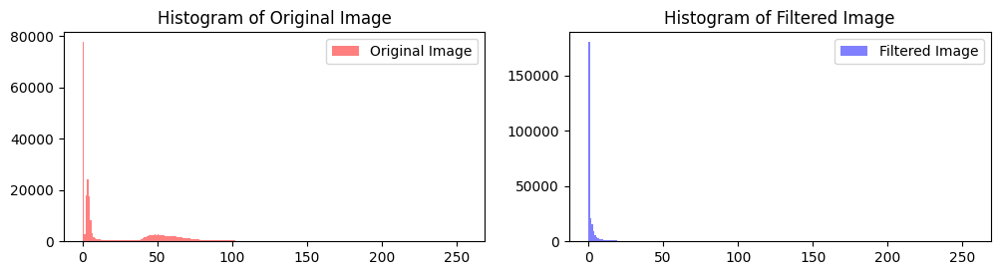

In [20]:
plt.figure(figsize=(12, 6))

# Original image histogram
plt.subplot(2, 2, 1)
plt.hist(image.ravel(), bins=256, range=(0, 256), color='r', alpha=0.5, label='Original Image')
plt.title('Histogram of Original Image')
plt.legend()

# Filtered image histogram
plt.subplot(2, 2, 2)
plt.hist(filtered_image.ravel(), bins=256, range=(0, 256), color='b', alpha=0.5, label='Filtered Image')
plt.title('Histogram of Filtered Image')
plt.legend()

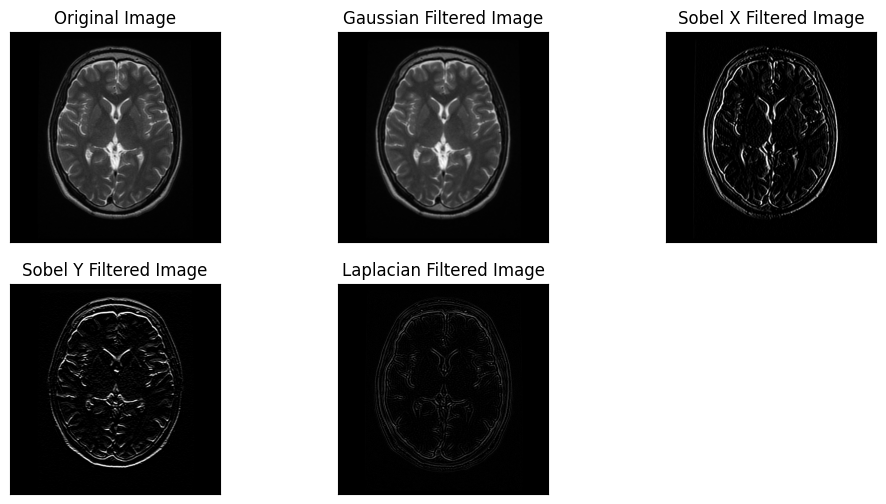

In [21]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(2, 3, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.xticks([]), plt.yticks([])

# Filtered images
for i, (filter, filter_name) in enumerate(zip(filters, filter_names)):
    filtered_image = cv2.filter2D(image, -1, filter)
    plt.subplot(2, 3, i + 2)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f'{filter_name} Filtered Image')
    plt.xticks([]), plt.yticks([])

Text(0.5, 1.0, 'Edge Detection')

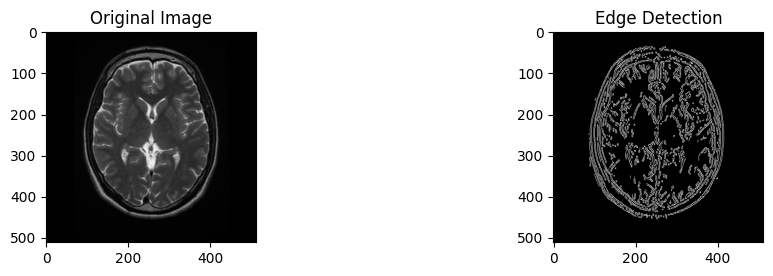

In [24]:
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')

# Edge detection using a filter (e.g., Sobel)
filtered_image = cv2.filter2D(image, -1, sobel_x)
edge_image = cv2.Canny(filtered_image, 50, 150)  # Apply Canny edge detection
plt.subplot(2, 2, 2)
plt.imshow(edge_image, cmap='gray')
plt.title('Edge Detection')

**Gradient Magnitude Visualization:** Display the magnitude of the gradient in the image, which can reveal edges and transitions more explicitly.

(([], []), ([], []))

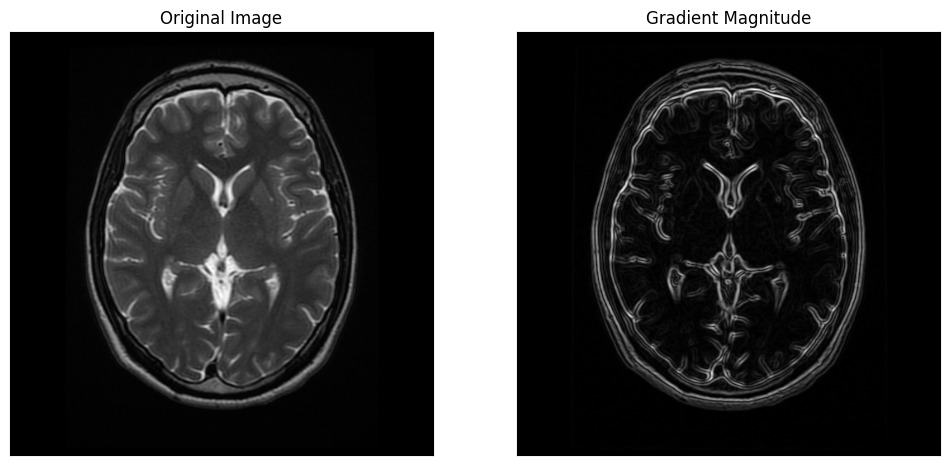

In [26]:
# Calculate the gradient using Sobel operators
gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)

# Compute the gradient magnitude
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)

plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.xticks([]), plt.yticks([])

# Gradient magnitude
plt.subplot(1, 2, 2)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude')
plt.xticks([]), plt.yticks([])

(([], []), ([], []))

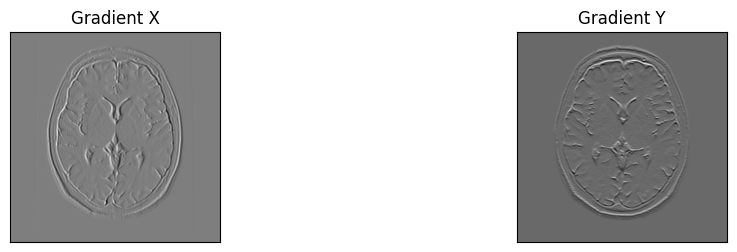

In [30]:
# Calculate gradient components using Sobel operators
gradient_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
gradient_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)

plt.figure(figsize=(12, 6))

# Gradient X component
plt.subplot(2, 2, 1)
plt.imshow(gradient_x, cmap='gray')
plt.title('Gradient X')
plt.xticks([]), plt.yticks([])

# Gradient Y component
plt.subplot(2, 2, 2)
plt.imshow(gradient_y, cmap='gray')
plt.title('Gradient Y')
plt.xticks([]), plt.yticks([])

**Filter Response Visualization:** Show the response of the filter as a heat map over the original image, indicating regions with strong filter response.

(([], []), ([], []))

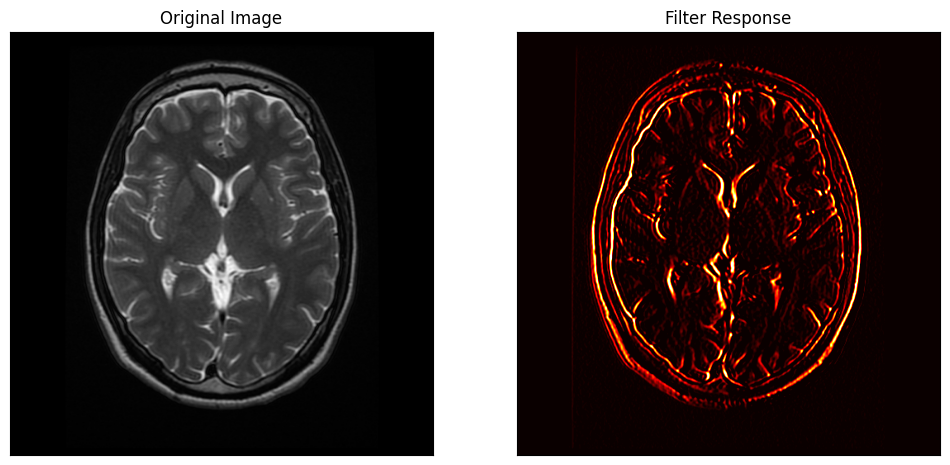

In [31]:
from skimage import color

# Convert the filtered image to grayscale if necessary
filtered_image_gray = color.rgb2gray(filtered_image) if len(filtered_image.shape) == 3 else filtered_image

plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.xticks([]), plt.yticks([])

# Filter response visualization
plt.subplot(1, 2, 2)
plt.imshow(filtered_image_gray, cmap='hot')
plt.title('Filter Response')
plt.xticks([]), plt.yticks([])

**Frequency Domain Analysis:** Visualize the amplitude and phase components of the Fourier transform to gain insights into the frequency characteristics of the image and filtered image.

(([], []), ([], []))

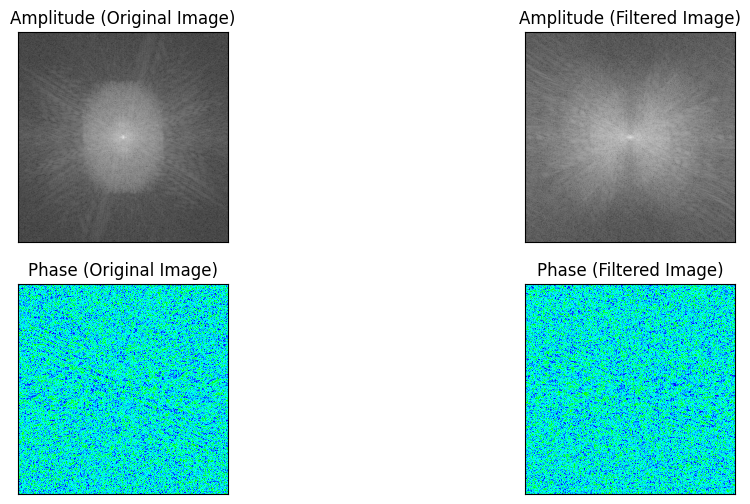

In [32]:
from scipy.signal import convolve2d

# Calculate the Fourier Transform of the image and filtered image
fft_original = np.fft.fftshift(np.fft.fft2(image))
fft_filtered = np.fft.fftshift(np.fft.fft2(filtered_image))

# Calculate the amplitude and phase components
amplitude_original = np.abs(fft_original)
phase_original = np.angle(fft_original)
amplitude_filtered = np.abs(fft_filtered)
phase_filtered = np.angle(fft_filtered)

plt.figure(figsize=(12, 6))

# Amplitude components
plt.subplot(2, 2, 1)
plt.imshow(np.log(amplitude_original + 1), cmap='gray')
plt.title('Amplitude (Original Image)')
plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 2)
plt.imshow(np.log(amplitude_filtered + 1), cmap='gray')
plt.title('Amplitude (Filtered Image)')
plt.xticks([]), plt.yticks([])

# Phase components
plt.subplot(2, 2, 3)
plt.imshow(phase_original, cmap='hsv')
plt.title('Phase (Original Image)')
plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 4)
plt.imshow(phase_filtered, cmap='hsv')
plt.title('Phase (Filtered Image)')
plt.xticks([]), plt.yticks([])

(([], []), ([], []))

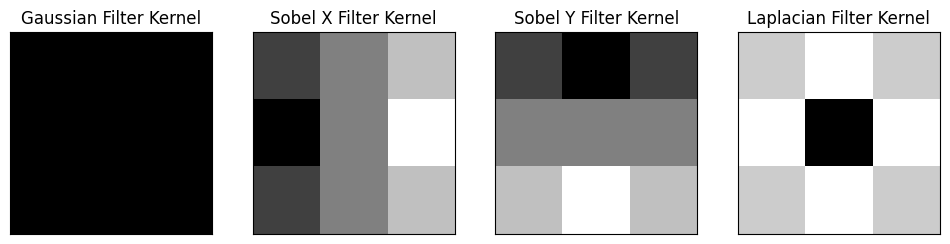

In [33]:
plt.figure(figsize=(12, 4))

# Visualize the Gaussian filter kernel
plt.subplot(1, 4, 1)
plt.imshow(gaussian, cmap='gray')
plt.title('Gaussian Filter Kernel')
plt.xticks([]), plt.yticks([])

# Visualize the Sobel X filter kernel
plt.subplot(1, 4, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X Filter Kernel')
plt.xticks([]), plt.yticks([])

# Visualize the Sobel Y filter kernel
plt.subplot(1, 4, 3)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y Filter Kernel')
plt.xticks([]), plt.yticks([])

# Visualize the Laplacian filter kernel
plt.subplot(1, 4, 4)
plt.imshow(laplacian, cmap='gray')
plt.title('Laplacian Filter Kernel')
plt.xticks([]), plt.yticks([])

(([], []), ([], []))

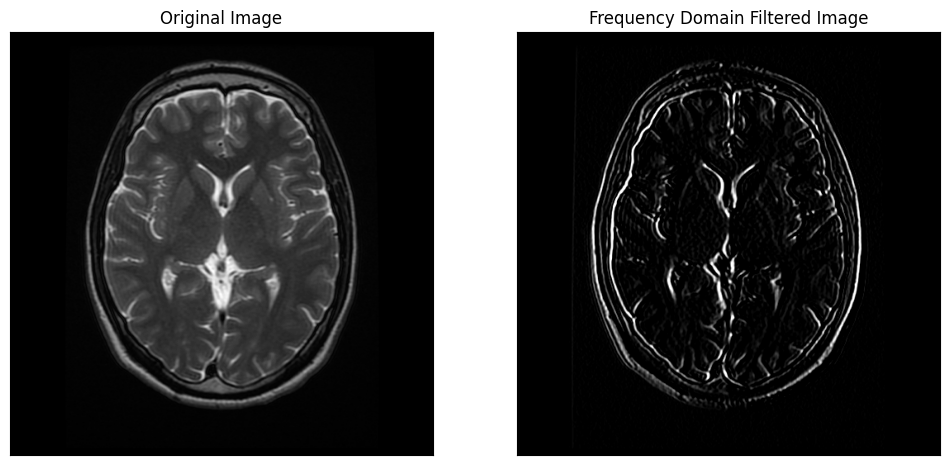

In [34]:
from scipy.fftpack import ifft2

# Apply inverse Fourier transform to filtered spectrum
filtered_image_frequency = np.fft.ifft2(fft_filtered)

plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.xticks([]), plt.yticks([])

# Frequency domain filtered image
plt.subplot(1, 2, 2)
plt.imshow(np.abs(filtered_image_frequency), cmap='gray')
plt.title('Frequency Domain Filtered Image')
plt.xticks([]), plt.yticks([])

# Convolutional Layer

The **convolutional layer** is produced by applying a series of many different image filters, also known as convolutional kernels, to an input image.


## The Importance of Filters

What you've just learned about different types of filters will be really important as you progress through this course, especially when you get to Convolutional Neural Networks (CNNs). CNNs are a kind of deep learning model that can learn to do things like image classification and object recognition. They keep track of spatial information and learn to extract features like the edges of objects in something called a **convolutional layer**. Below you'll see an simple CNN structure, made of multiple layers, below, including this "convolutional layer".

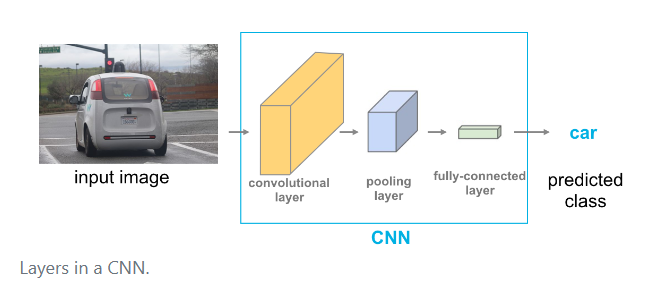

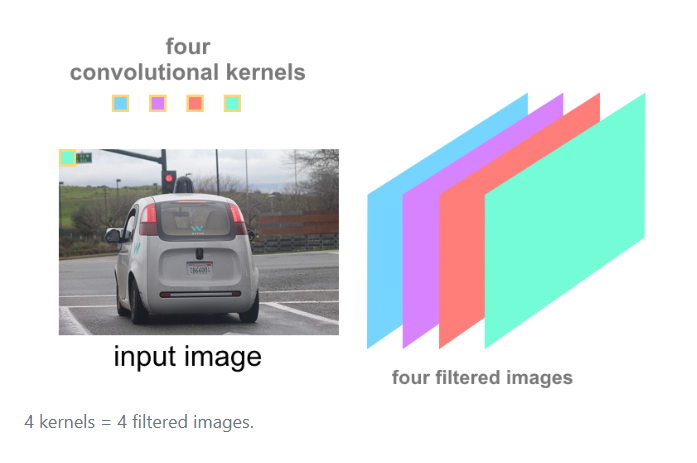

In the example shown, 4 different filters produce 4 differently filtered output images. When we stack these images, we form a complete convolutional layer with a depth of 4!

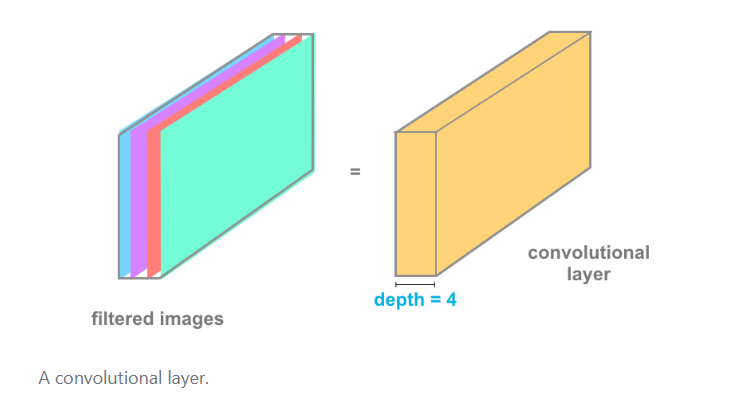

# Canny Edge Detector

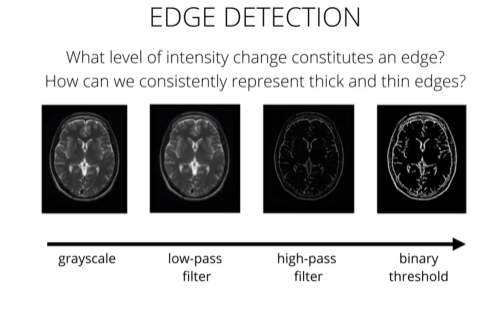

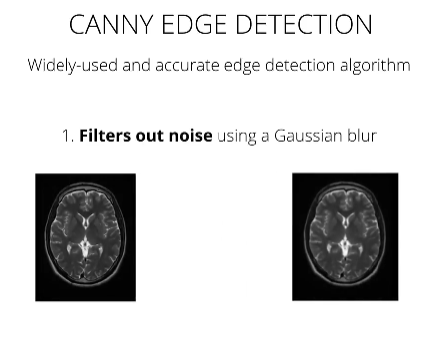

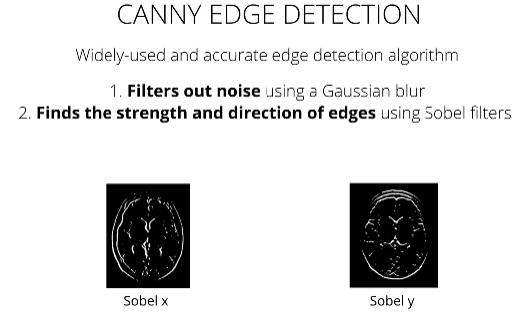

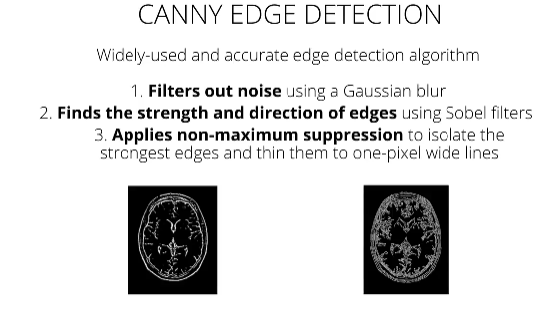

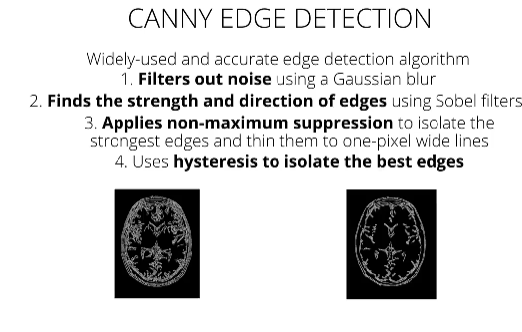

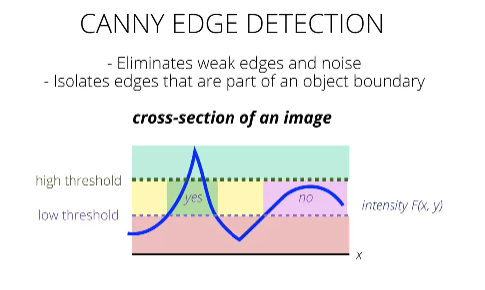

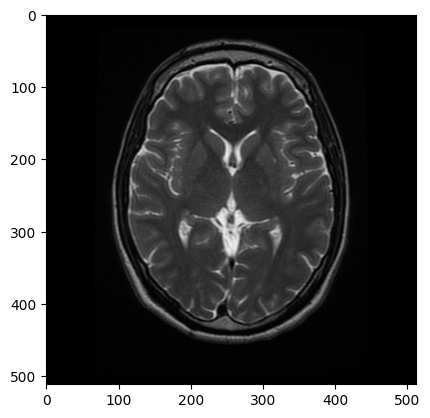

In [36]:
# Read in the image
image = cv2.imread('img/brain_MR.jpg')

# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

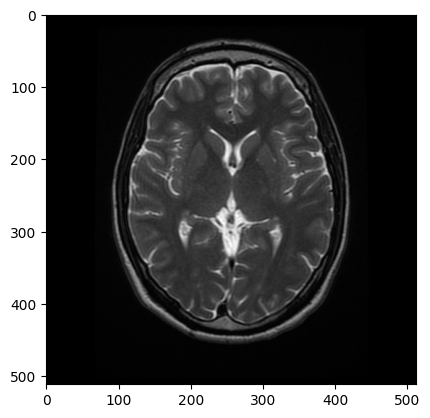

In [37]:
# Convert the image to grayscale for processing
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

plt.imshow(gray, cmap='gray')

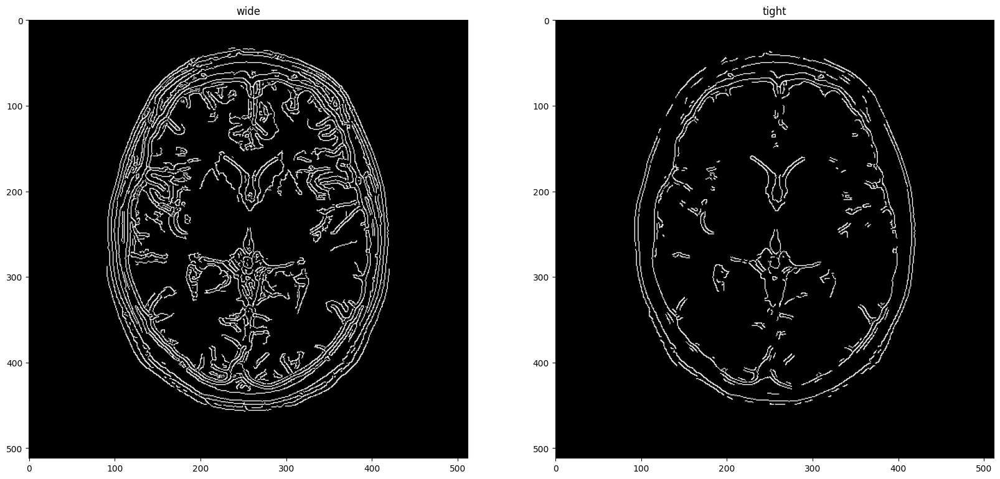

In [38]:
# Try Canny using "wide" and "tight" thresholds

wide = cv2.Canny(gray, 30, 100)
tight = cv2.Canny(gray, 200, 240)
 
    
# Display the images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('wide')
ax1.imshow(wide, cmap='gray')

ax2.set_title('tight')
ax2.imshow(tight, cmap='gray')

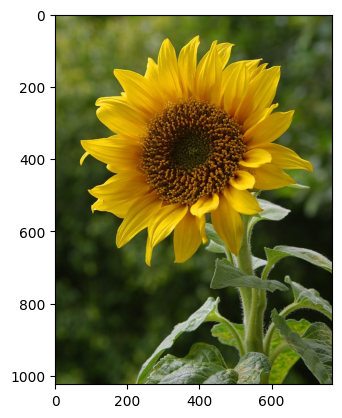

In [39]:
# Read in the image
image = cv2.imread('img/sunflower.jpg')

# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

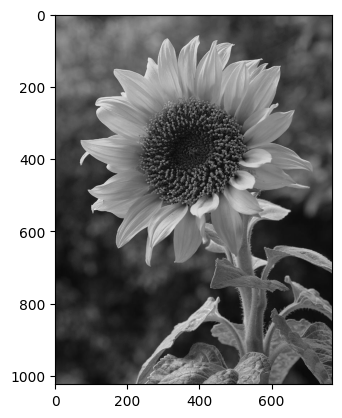

In [40]:
# Convert the image to grayscale for processing
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

plt.imshow(gray, cmap='gray')

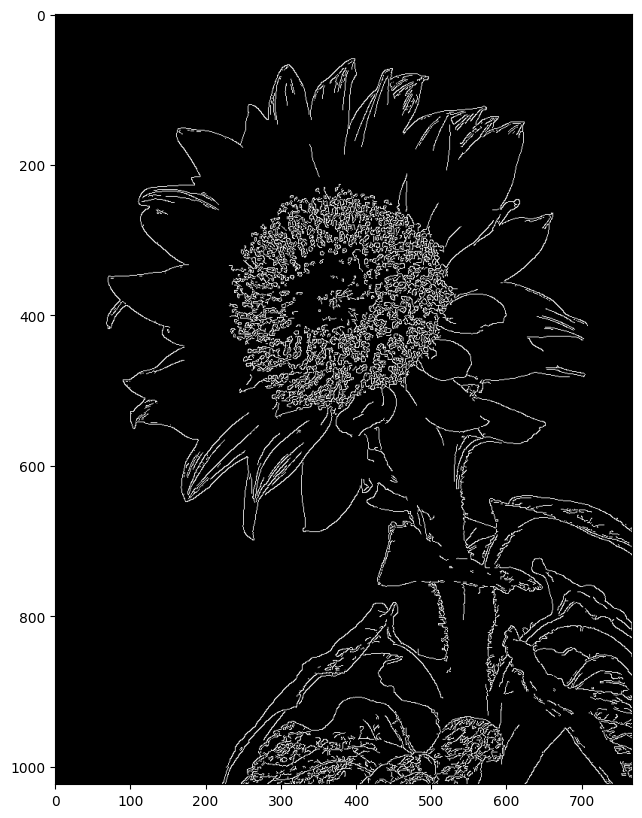

In [42]:
lower = 120
upper = 250

edges = cv2.Canny(gray, lower, upper)

plt.figure(figsize=(20,10))
plt.imshow(edges, cmap='gray')

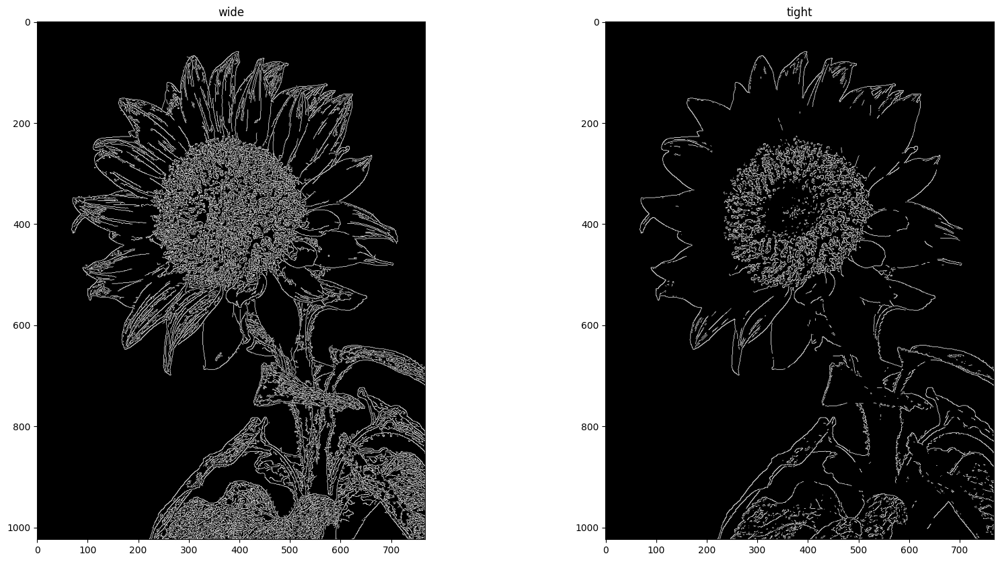

In [43]:
# Try Canny using "wide" and "tight" thresholds

wide = cv2.Canny(gray, 30, 100)
tight = cv2.Canny(gray, 200, 240)
 
    
# Display the images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

ax1.set_title('wide')
ax1.imshow(wide, cmap='gray')

ax2.set_title('tight')
ax2.imshow(tight, cmap='gray')

# Shape Detection

## Edge Detection
Now that you've seen how to define and use image filters for smoothing images and detecting the edges (high-frequency) components of objects in an image, let's move one step further. The next few videos will be all about how we can use what we know about pattern recognition in images to begin identifying unique shapes and then objects.

## Edges to Boundaries and Shapes

We know how to detect the edges of objects in images, but how can we begin to find unifying boundaries around objects? We'll want to be able to do this to separate and locate multiple objects in a given image. Next, we'll discuss the Hough transform, which transforms image data from the x-y coordinate system into Hough space, where you can easily identify simple boundaries like lines and circles.

The Hough transform is used in a variety of shape-recognition applications, as seen in the images pictured below. On the left you see how a Hough transform can find the edges of a phone screen and on the right you see how it's applied to an aerial image of farms (green circles in this image).

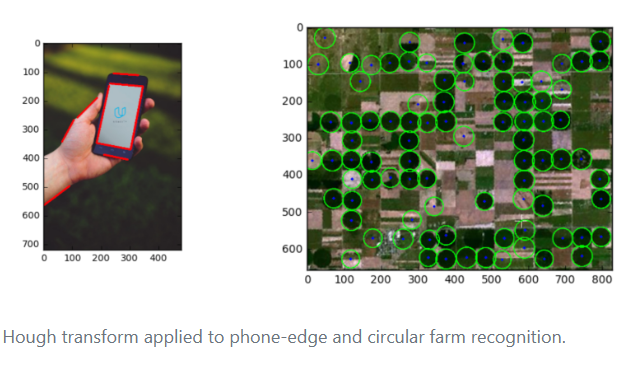

# Hough Transform

The **Hough Transform** is a technique used for detecting shapes, particularly lines and circles, within an image. It works by transforming the image space into a parameter space and finding patterns or shapes that correspond to specific parameter values.

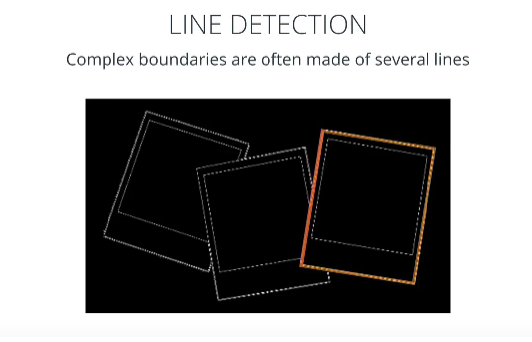

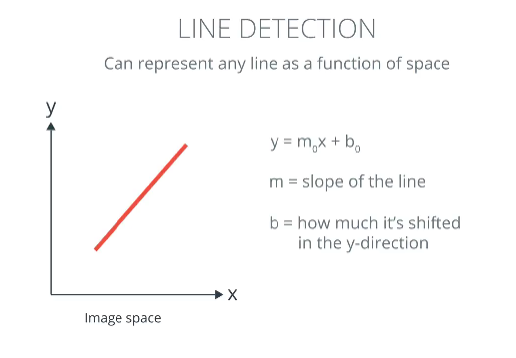

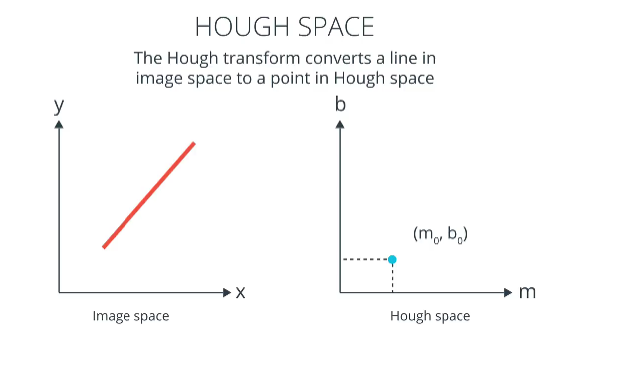

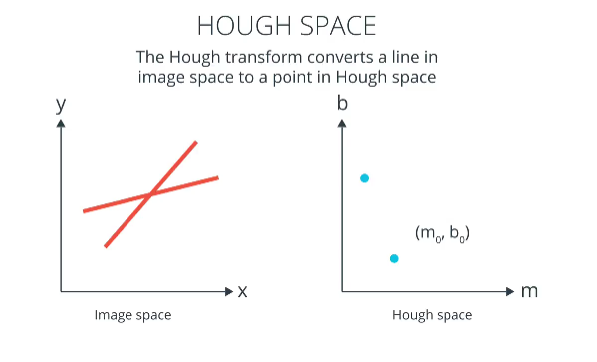

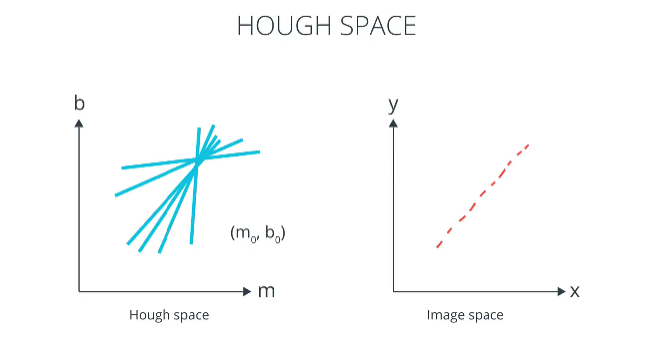

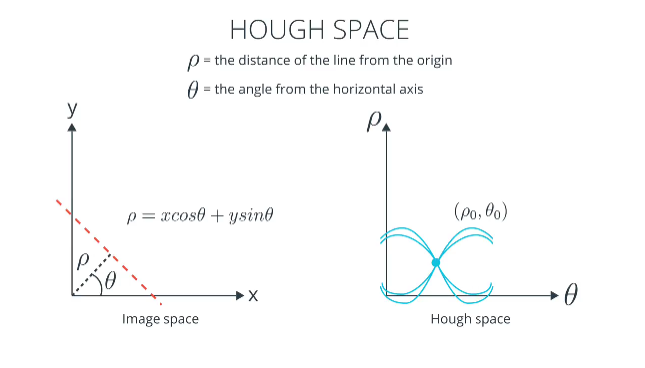

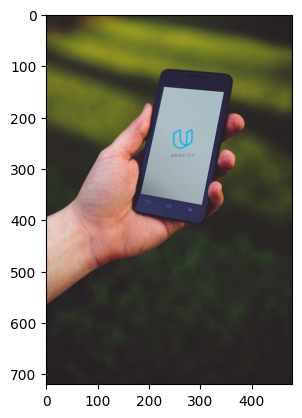

In [44]:
# Read in the image
image = cv2.imread('img/phone.jpg')

# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

### Perform edge detection

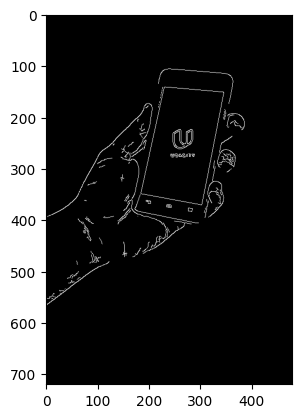

In [45]:
# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Define our parameters for Canny
low_threshold = 50
high_threshold = 100
edges = cv2.Canny(gray, low_threshold, high_threshold)

plt.imshow(edges, cmap='gray')

### Find lines using a Hough transform

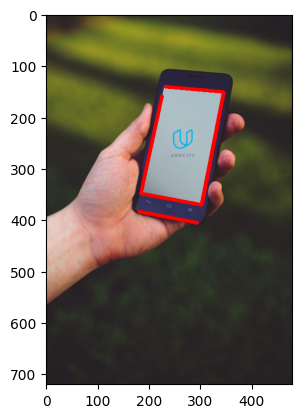

In [50]:
# Define the Hough transform parameters
rho = 1
theta = np.pi/180
threshold = 60
min_line_length = 100
max_line_gap = 5

line_image = np.copy(image) #creating an image copy to draw lines on

# Run Hough on the edge-detected image
lines = cv2.HoughLinesP(edges, rho, theta, threshold, np.array([]),
                        min_line_length, max_line_gap)


# Iterate over the output "lines" and draw lines on the image copy
for line in lines:
    for x1,y1,x2,y2 in line:
        cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)
        
plt.imshow(line_image)

Text(0, 0.5, 'Frequency')

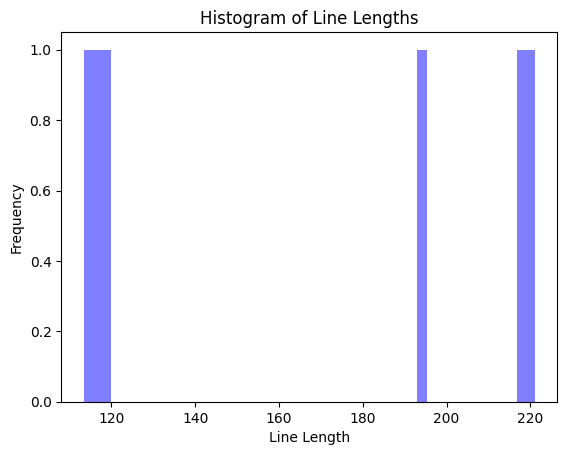

In [55]:
line_lengths = []
for line in lines:
    for x1, y1, x2, y2 in line:
        length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        line_lengths.append(length)

plt.hist(line_lengths, bins=50, color='b', alpha=0.5)
plt.title('Histogram of Line Lengths')
plt.xlabel('Line Length')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

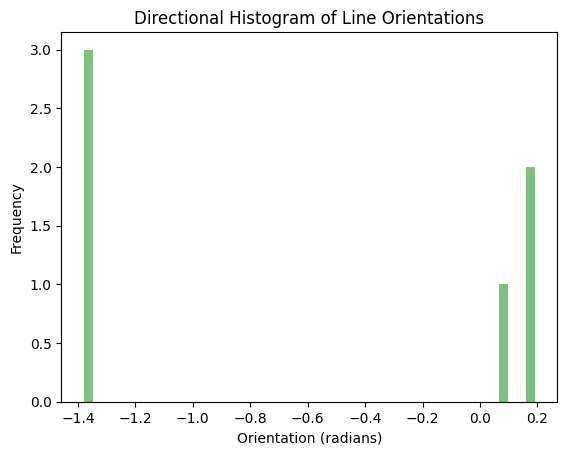

In [56]:
line_orientations = []
for line in lines:
    for x1, y1, x2, y2 in line:
        angle = np.arctan2(y2 - y1, x2 - x1)
        line_orientations.append(angle)

plt.hist(line_orientations, bins=50, color='g', alpha=0.5)
plt.title('Directional Histogram of Line Orientations')
plt.xlabel('Orientation (radians)')
plt.ylabel('Frequency')

Text(0, 0.5, 'Line Length')

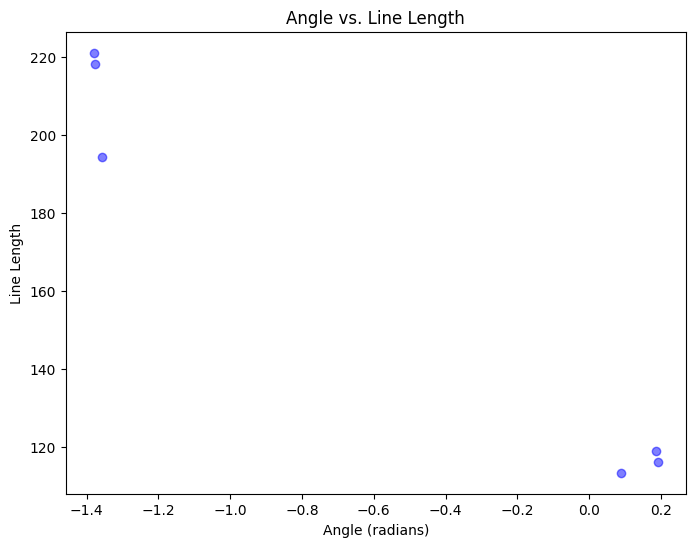

In [60]:
line_angles = []
line_lengths = []

for line in lines:
    for x1, y1, x2, y2 in line:
        angle = np.arctan2(y2 - y1, x2 - x1)
        length = np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
        line_angles.append(angle)
        line_lengths.append(length)

plt.figure(figsize=(8, 6))
plt.scatter(line_angles, line_lengths, c='b', marker='o', alpha=0.5)
plt.title('Angle vs. Line Length')
plt.xlabel('Angle (radians)')
plt.ylabel('Line Length')

## Hough Circle Detection

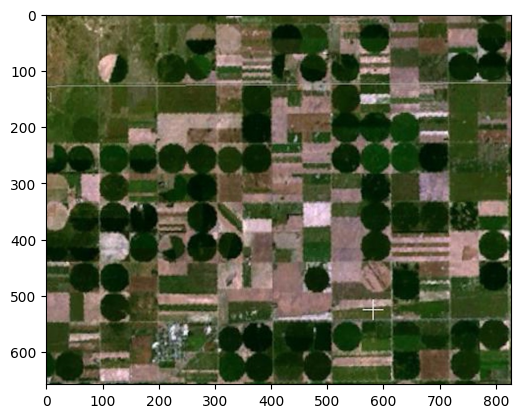

In [63]:
# Read in the image
image = cv2.imread('img/round_farms.jpg')

# Change color to RGB (from BGR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.imshow(image)

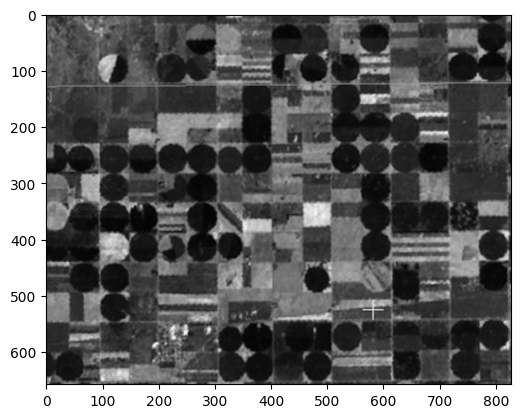

In [64]:
# Gray and blur
gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)

plt.imshow(gray_blur, cmap='gray')

### HoughCircles function

HoughCircles takes in a few things as its arguments:

* an input image, detection method (Hough gradient), resolution factor between the detection and image (1),
* minDist - the minimum distance between circles
* param1 - the higher value for performing Canny edge detection
* param2 - threshold for circle detection, a smaller value --> more circles will be detected
* min/max radius for detected circles

The variable you should change will be the last two: min/max radius for detected circles. Take a look at the image above and estimate how many pixels the average circle is in diameter; use this estimate to provide values for min/max arguments. You may also want to see what happens if you change minDist.

Circles shape:  (1, 84, 3)


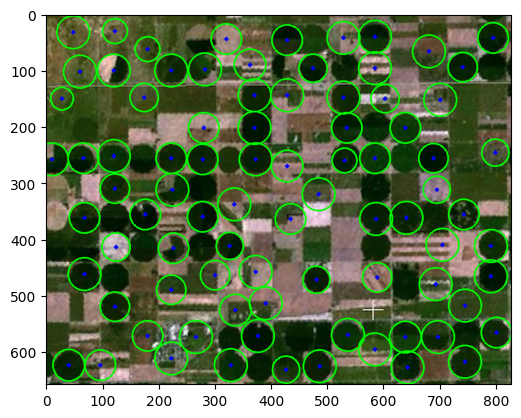

In [96]:
# for drawing circles on
circles_im = np.copy(image)

# right now there are too many, large circles being detected
# try changing the value of maxRadius, minRadius, and minDist
circles = cv2.HoughCircles(gray_blur, cv2.HOUGH_GRADIENT, 1, 
                           minDist=55,
                           param1=70,
                           param2=11,
                           minRadius=20,
                           maxRadius=30)

# convert circles into expected type
circles = np.uint16(np.around(circles))
# draw each one
for i in circles[0,:]:
    # draw the outer circle
    cv2.circle(circles_im,(i[0],i[1]),i[2],(0,255,0),2)
    # draw the center of the circle
    cv2.circle(circles_im,(i[0],i[1]),2,(0,0,255),3)
    
plt.imshow(circles_im)

print('Circles shape: ', circles.shape)

Text(0.5, 1.0, 'Histogram of Circle Radii')

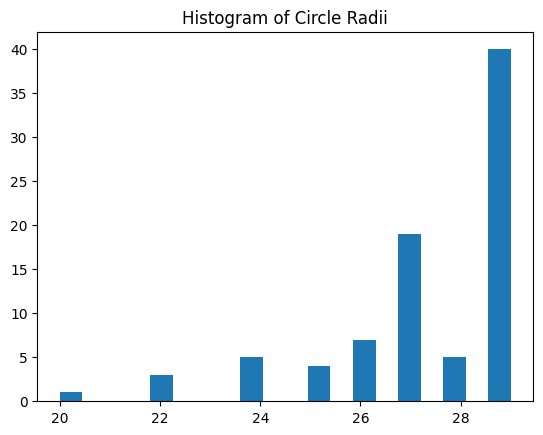

In [99]:
radii = circles[0, :, 2]
plt.hist(radii, bins=20)
plt.title('Histogram of Circle Radii')

(0.0, 1.0, 0.0, 1.0)

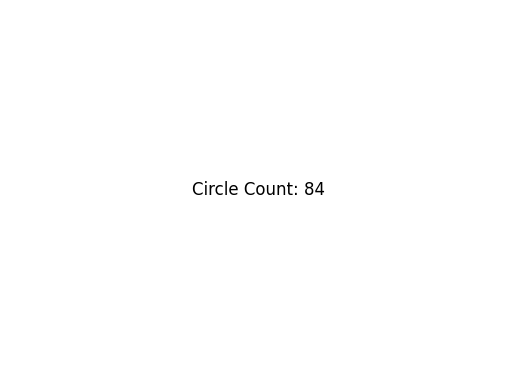

In [100]:
plt.text(0.5, 0.5, f'Circle Count: {circles.shape[1]}', fontsize=12, ha='center')
plt.axis('off')

Text(0.5, 1.0, 'Circles Overlay')

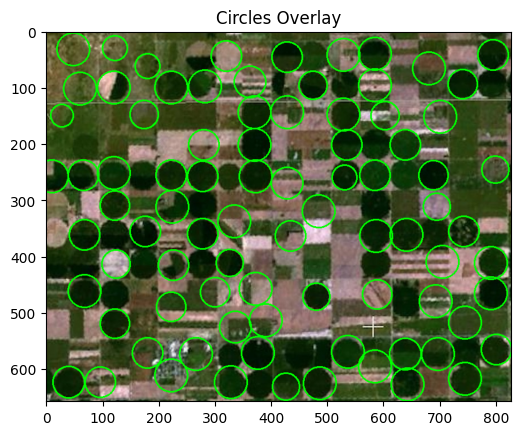

In [101]:
for i in circles[0, :]:
    cv2.circle(image, (i[0], i[1]), i[2], (0, 255, 0), 2)

plt.imshow(image)
plt.title('Circles Overlay')

Text(0.5, 1.0, 'Accumulator Array')

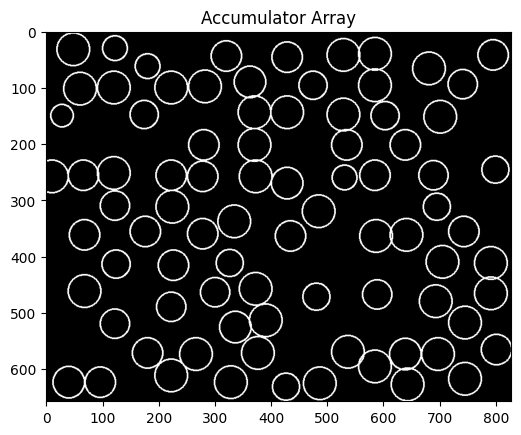

In [102]:
# Plot the accumulator array
accumulator = np.zeros_like(gray_blur)
for i in circles[0, :]:
    cv2.circle(accumulator, (i[0], i[1]), i[2], (255, 255, 255), 2)

plt.imshow(accumulator, cmap='gray')
plt.title('Accumulator Array')

Text(0.5, 1.0, 'Detected Circles with Centroids')

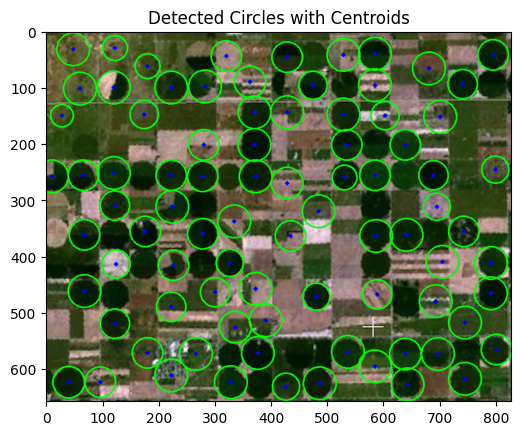

In [103]:
for i in circles[0, :]:
    cv2.circle(image, (i[0], i[1]), i[2], (0, 255, 0), 2)
    cv2.circle(image, (i[0], i[1]), 2, (0, 0, 255), 3)

plt.imshow(image)
plt.title('Detected Circles with Centroids')

Text(0, 0.5, 'Count')

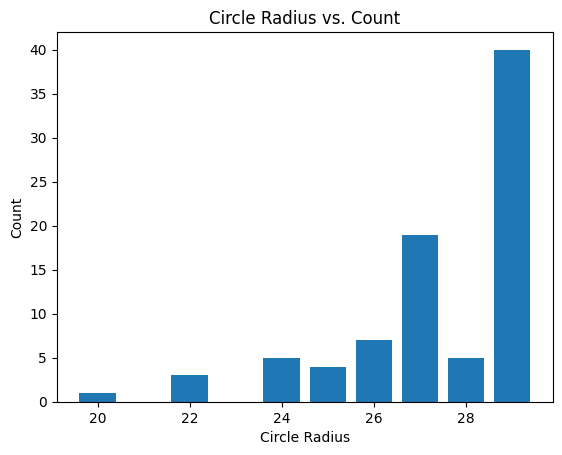

In [104]:
unique_radii, counts = np.unique(radii, return_counts=True)

plt.bar(unique_radii, counts)
plt.title('Circle Radius vs. Count')
plt.xlabel('Circle Radius')
plt.ylabel('Count')

Text(0.5, 1.0, 'Accumulator Heatmap')

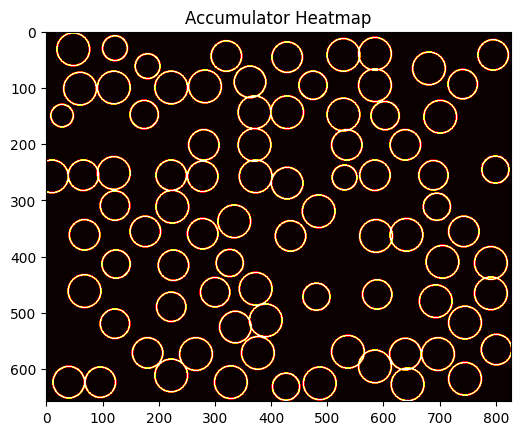

In [105]:
plt.imshow(accumulator, cmap='hot')
plt.title('Accumulator Heatmap')

Text(0, 0.5, 'Average Intensity')

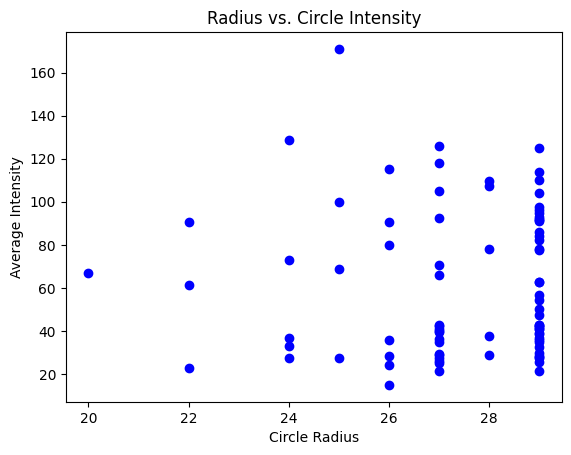

In [107]:
circle_intensity = []
for i in circles[0, :]:
    circle_mask = np.zeros_like(gray_blur)
    cv2.circle(circle_mask, (i[0], i[1]), i[2], 1, -1)
    mean_intensity = np.mean(gray_blur[circle_mask == 1])
    circle_intensity.append(mean_intensity)

plt.scatter(radii, circle_intensity, c='b', marker='o')
plt.title('Radius vs. Circle Intensity')
plt.xlabel('Circle Radius')
plt.ylabel('Average Intensity')

Text(0, 0.5, 'Y Coordinate')

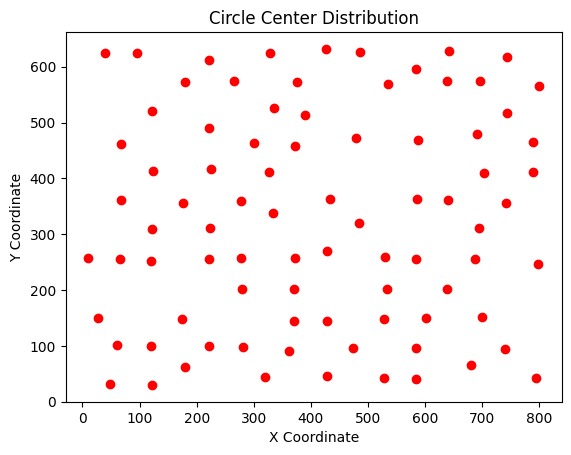

In [110]:
x_centers = circles[0, :, 0]
y_centers = circles[0, :, 1]

plt.scatter(x_centers, y_centers, c='r', marker='o')
plt.title('Circle Center Distribution')
plt.xlabel('X Coordinate')
plt.ylabel('Y Coordinate')

Text(0, 0.5, 'Circle Area')

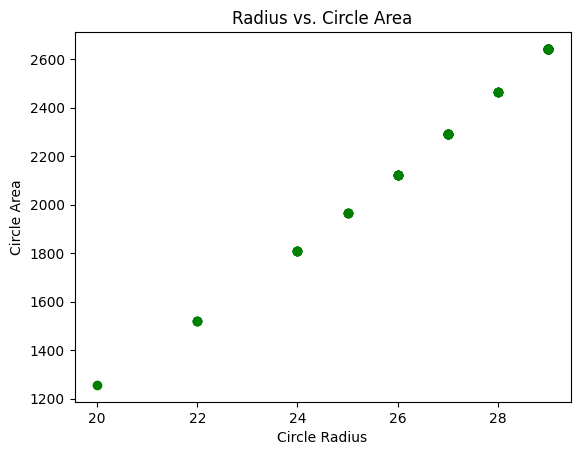

In [111]:
circle_area = np.pi * (radii ** 2)

plt.scatter(radii, circle_area, c='g', marker='o')
plt.title('Radius vs. Circle Area')
plt.xlabel('Circle Radius')
plt.ylabel('Circle Area')

Text(0.5, 1.0, 'Circle Area Distribution')

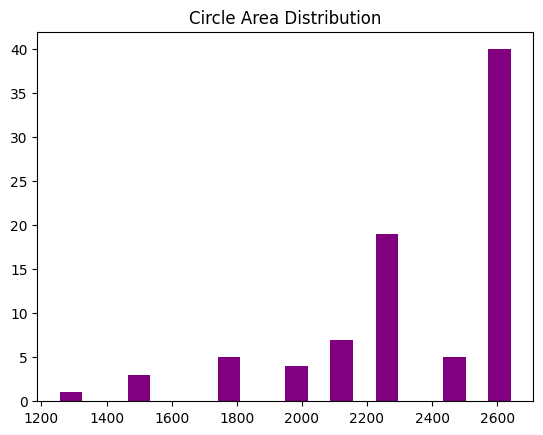

In [112]:
plt.hist(circle_area, bins=20, color='purple')
plt.title('Circle Area Distribution')

Text(0.5, 1.0, 'Circles on Gradient Image')

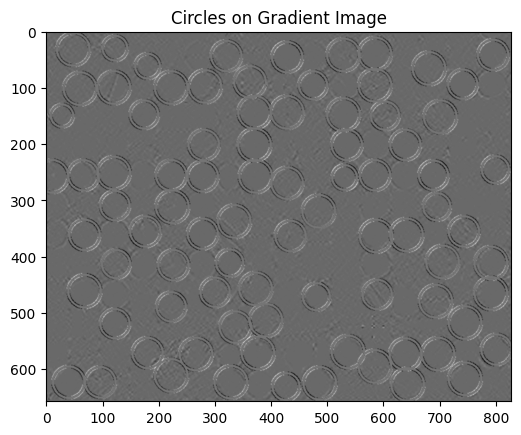

In [113]:
gradient = cv2.Sobel(gray_blur, cv2.CV_64F, 1, 1, ksize=5)

for i in circles[0, :]:
    cv2.circle(gradient, (i[0], i[1]), i[2], 255, 2)

plt.imshow(gradient, cmap='gray')
plt.title('Circles on Gradient Image')

# Object Recognition & Introducing Haar Cascades

## Feature Extraction and Object Recognition

So, you've seen how to detect consistent shapes with something like the Hough transform that transforms shapes in x-y coordinate space into intersecting lines in Hough space. You've also gotten experience programming your own image filters to perform edge detection. Filtering images is a feature extraction technique because it filters out unwanted image information and extracts unique and identfiying features like edges or corners.

Extracting features and patterns in image data, using things like image filters, is the basis for many object recognition techniques. In the image below, we see a classification pipeline that is looking at an image of a banana; the image first goes through some filters and processing steps to form a feature that represent that banana, and this is used to help classify it. And we'll learn more about feature types and extraction methods in the next couple lessons.

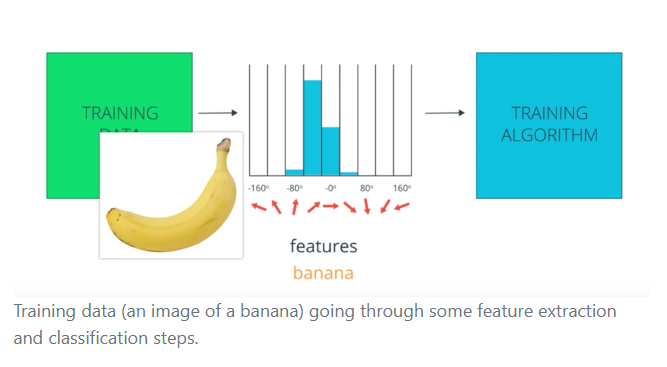

### Haar Cascade:

* Haar Cascade is a machine learning object detection method used to detect objects in images or video.
* It uses trained classifiers to identify features like edges, lines, and textures.
* Commonly used for face detection, eye detection, and more.
* OpenCV library provides pre-trained Haar Cascade classifiers for various objects.

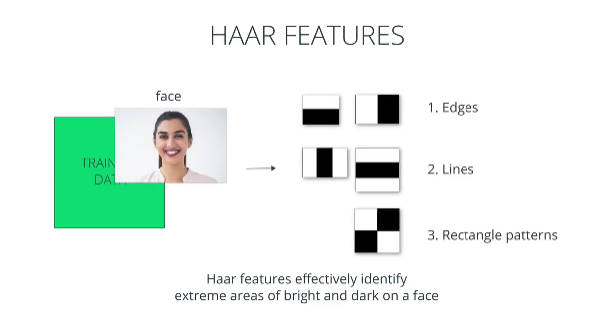



### Face Recognition:

* Face recognition is the task of identifying or verifying a person based on their facial features.
* It can be done using methods like Eigenfaces, Fisherfaces, and deep learning-based approaches (e.g., FaceNet).
* Deep learning frameworks like OpenFace, dlib, and Face recognition libraries simplify face recognition tasks.
* Applications include security systems, access control, and photo tagging.

# Beyond Edges, Selecting Different Features

## Features

Features and feature extraction is the basis for many computer vision applications. The idea is that any set of data, such as a set of images, can be represented by a smaller, simpler model made of a combination of visual features: a few colors and shapes. (This is true with one exception: completely random data!)

If you can find a good model for any set of data, then you can start to find ways to identify patterns in data based on similarities and differences in the features in an image. This is especially important when we get to deep learning models for image classification, which you'll see soon.

Below is an example of a simple model for rainbow colors. Each of the colors below is actually a combination of a smaller set of color features: red, yellow, and blue. For example, purple = red + blue. And these simple features give us a way to represent a variety of colors and classify them accoring to their red, yellow, and blue components!

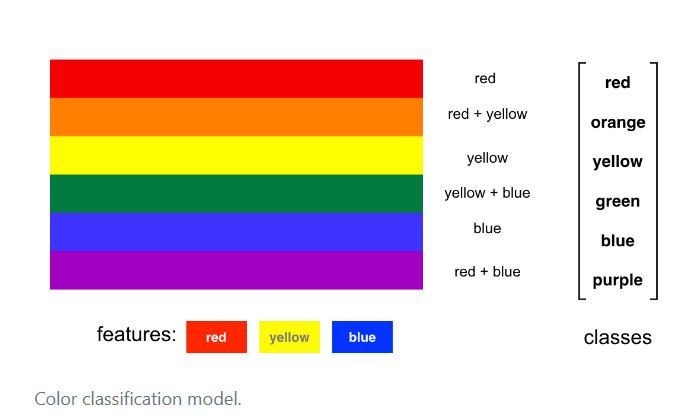

## Types of Features

We've described features as measurable pieces of data in an image that help distinguish between different classes of images.

There are two main types of features:

* Color-based and
* Shape-based

Both of these are useful in different cases and they are often powerful together. We know that color is all you need should you want to classify day/night images or implement a green screen. Let's look at another example: say I wanted to classify a stop sign vs. any other traffic sign. Stop signs are supposed to stand out in color and shape! A stop sign is an octagon (it has 8 flat sides) and it is very red. It's red color is often enough to distinguish it, but the sign can be obscured by trees or other artifacts and the shape ends up being important, too.

As a different example, say I want to detect a face and perform facial recognition. I'll first want to detect a face in a given image; this means at least recognizing the boundaries and some features on that face, which are all determined by shape. Specifically, I'll want to identify the edges of the face and the eyes and mouth on that face, so that I can identify the face and recognize it. Color is not very useful in this case, but shape is critical.

### A note on shape

Edges are one of the simplest shapes that you can detect; edges often define the boundaries between objects but they may not provide enough information to find and identify small features on those objects (such as eyes on a face) and in the next videos, we'll look at methods for finding even more complex shapes.

As you continue learning, keep in mind that selecting the right feature is an important computer vision task.

## Example Application: Lane Finding

You've already had some practice with this concept, but you can use feature/edge detection and color transforms to very effectively detect lane lines on a road.

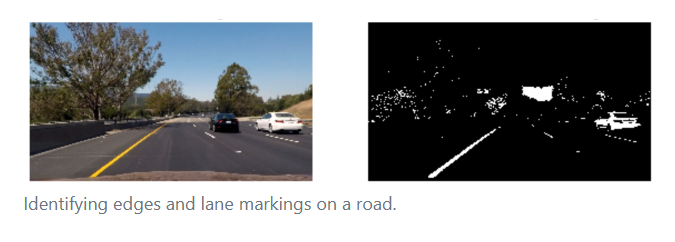

# Face detection using OpenCV

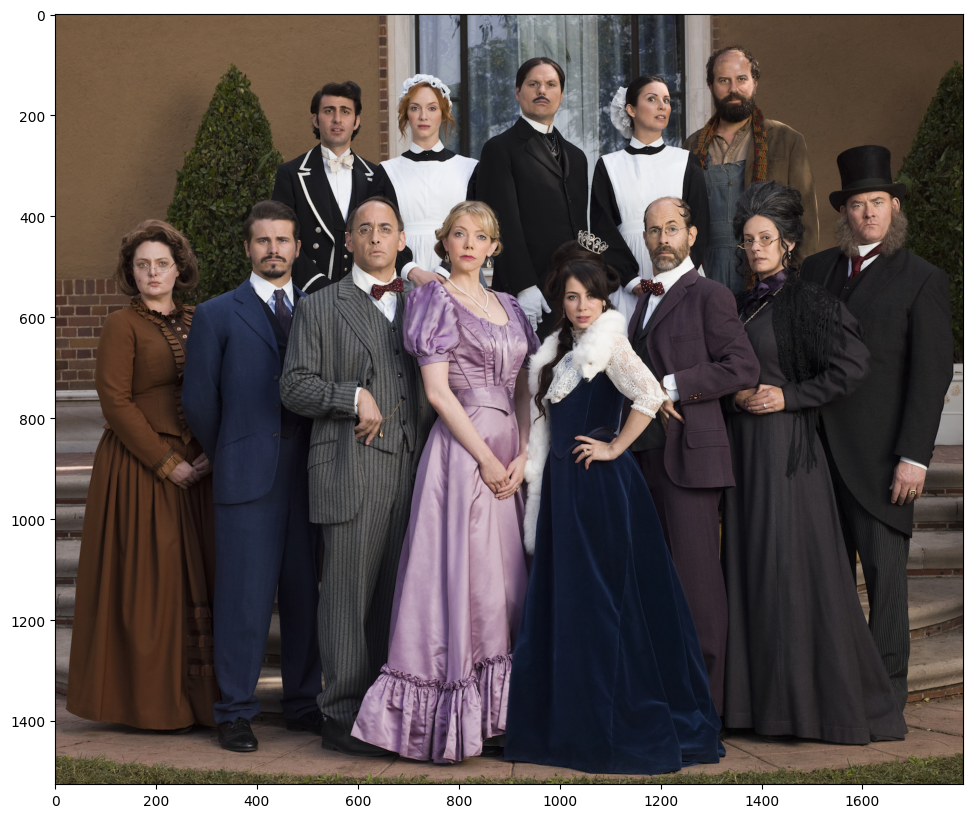

In [115]:
# load in color image for face detection
image = cv2.imread('img/multi_faces.jpg')

# convert to RBG
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(image)

To use a face detector, we'll first convert the image from color to grayscale. For face detection this is perfectly fine to do as there is plenty non-color specific structure in the human face for our detector to learn on.

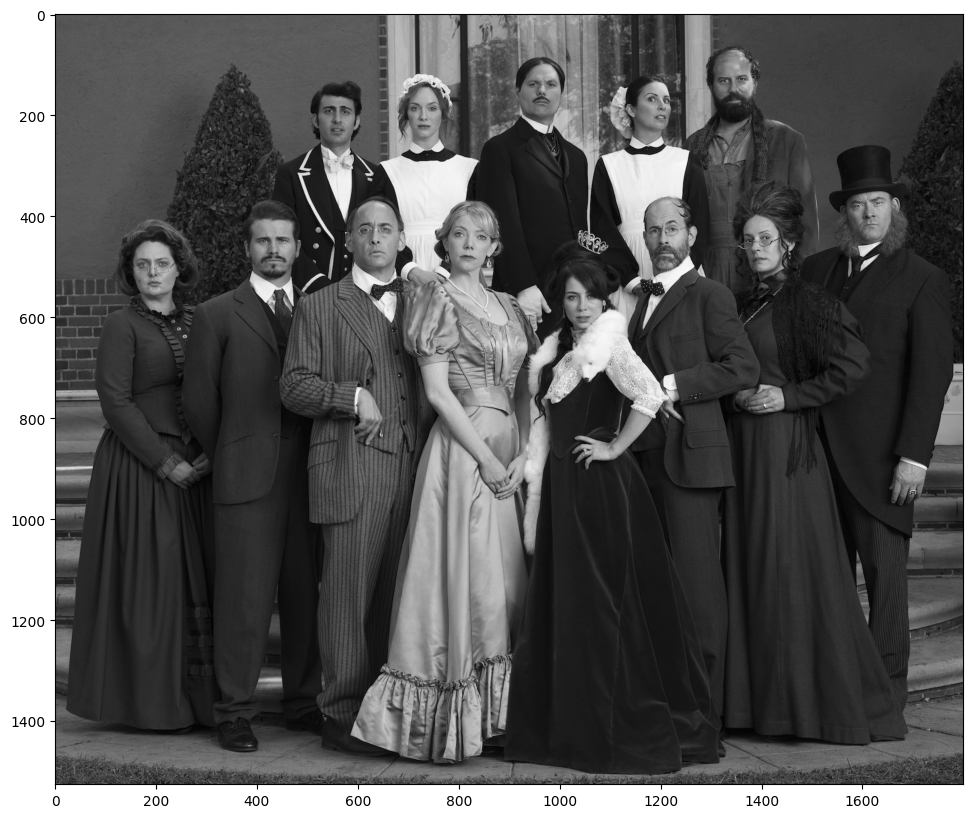

In [116]:
# convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  

plt.figure(figsize=(20,10))
plt.imshow(gray, cmap='gray')

**A note on parameters**

How many faces are detected is determined by the function, detectMultiScale which aims to detect faces of varying sizes. The inputs to this function are: (image, scaleFactor, minNeighbors); you will often detect more faces with a smaller scaleFactor, and lower value for minNeighbors, but raising these values often produces better matches. Modify these values depending on your input image.

In [117]:
# load in cascade classifier
face_cascade = cv2.CascadeClassifier('detector_architectures/haarcascade_frontalface_default.xml')

# run the detector on the grayscale image
faces = face_cascade.detectMultiScale(gray, 4, 6)

The output of the classifier is an array of detections; coordinates that define the dimensions of a bounding box around each face. Note that this always outputs a bounding box that is square in dimension.

In [118]:
# print out the detections found
print ('We found ' + str(len(faces)) + ' faces in this image')
print ("Their coordinates and lengths/widths are as follows")
print ('=============================')
print (faces)

We found 13 faces in this image
Their coordinates and lengths/widths are as follows
[[ 683  149   96   96]
 [ 510  158   96   96]
 [ 383  414   96   96]
 [1565  339   96   96]
 [ 146  458   96   96]
 [ 588  390   96   96]
 [1157  391   96   96]
 [1295   94   96   96]
 [ 917  102   96   96]
 [ 771  405   96   96]
 [ 996  526   96   96]
 [1345  411   96   96]
 [1148  131   96   96]]


Let's plot the corresponding detection boxes on our original image to see how well we've done.

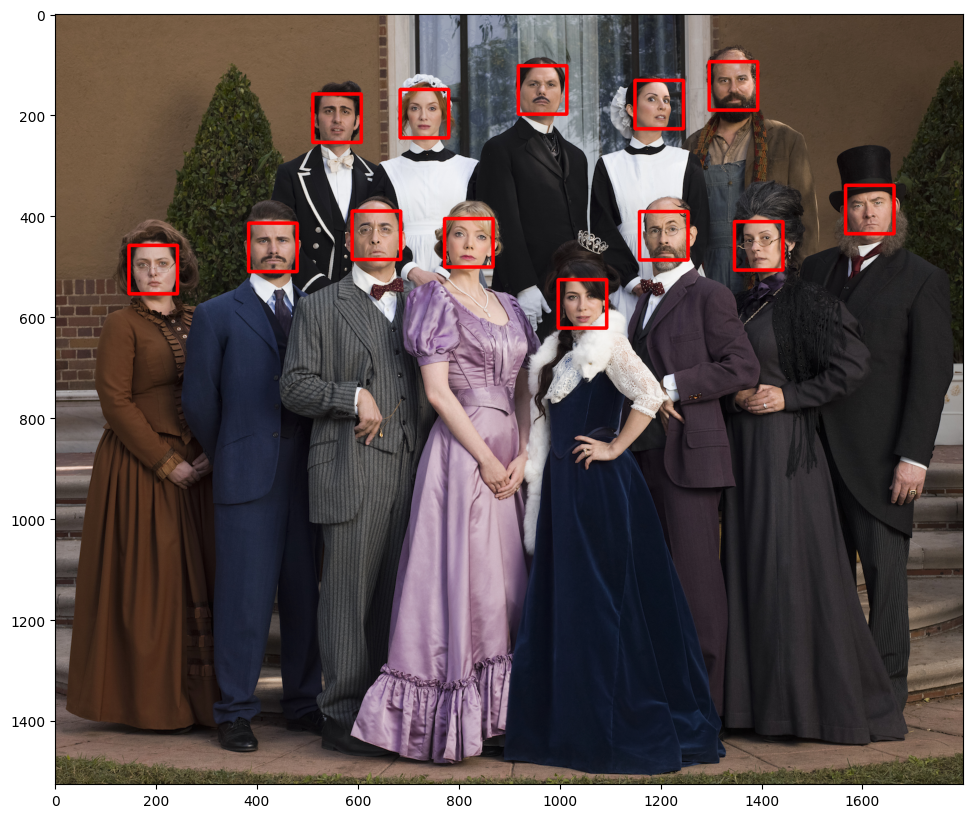

In [119]:
img_with_detections = np.copy(image)   # make a copy of the original image to plot rectangle detections ontop of

# loop over our detections and draw their corresponding boxes on top of our original image
for (x,y,w,h) in faces:
    # draw next detection as a red rectangle on top of the original image.  
    # Note: the fourth element (255,0,0) determines the color of the rectangle, 
    # and the final argument (here set to 5) determines the width of the drawn rectangle
    cv2.rectangle(img_with_detections,(x,y),(x+w,y+h),(255,0,0),5)  

# display the result
plt.figure(figsize=(20,10))
plt.imshow(img_with_detections)